In [1]:
from multiprocessing import cpu_count
from pathlib import Path
from typing import List, Union, AnyStr
from math import pi
import pickle

import numpy as np
import torch
import matplotlib.pyplot as plt
import torch.nn as nn
from sklearn import model_selection
from tqdm import tqdm
import torch_optimizer
from torch.utils.data import Dataset, DataLoader, random_split
import pandas as pd
import random
from torchvision.models.resnet import resnet18

import torch_burn as tb
import utils

In [2]:
tb.seed_everything(0)

In [3]:
EXPERIMENT_NAME = 'GAN-ResNet'
RESULT_DIR = Path('results')
dirs = []
for f in RESULT_DIR.iterdir():
    if not f.is_dir() or len(f.name) < 6 or not str.isdigit(f.name[:4]):
        continue
    dirs.append(f)
dirs = sorted(dirs)
experiment_number = int(dirs[-1].name[:4]) + 1 if dirs else 0

EXPERIMENT_DIR = RESULT_DIR / f'{experiment_number:04d}-{EXPERIMENT_NAME}'
EXPERIMENT_DIR.mkdir(parents=True, exist_ok=True)
print('Experiment path:', EXPERIMENT_DIR)

DATA_DIR = Path('data/1116')

Experiment path: results/0045-GAN-ResNet


# Create Dataset

In [4]:
def load_result(checkpoint_dir):
    d = Path(checkpoint_dir)
    X = np.load(d / 'result-X.npy')
    Y = np.load(d / 'result-Y.npy')
    P = np.load(d / 'result-P.npy')
    return X, Y, P

In [5]:
X, Y, P = load_result('checkpoint/1130-Scene3-CLSTMC4-X60')

In [6]:
X.shape, Y.shape, P.shape

((54167, 60, 6), (54167, 3), (54167, 3))

In [7]:
class DetectorDataset(Dataset):
    def __init__(self, Y, P, L):
        super(DetectorDataset, self).__init__()

        self.Y = torch.tensor(Y, dtype=torch.float32).transpose(0, 1)
        self.P = torch.tensor(P, dtype=torch.float32).transpose(0, 1)
        self.L = L
        self.dssize = self.Y.shape[1] // self.L
        
        self.means = torch.stack([self.Y[0].mean(), self.Y[1].mean(), self.Y[2].mean()]).unsqueeze(1)
        self.stds = torch.stack([self.Y[0].std(), self.Y[1].std(), self.Y[2].std()]).unsqueeze(1)
        self.Y = (self.Y - self.means) / self.stds
        self.P = (self.P - self.means) / self.stds

    def __len__(self):
        return self.dssize

    def __getitem__(self, idx):
        x = self.Y[:, idx:idx + self.L]
        x_ = self.P[:, idx:idx + self.L]
        return x, x_

In [8]:
ds = DetectorDataset(Y, P, 120)

# Create Model

## Model Common Parts

In [9]:
class ResBlock1d(nn.Module):
    expansion = 1
    
    def __init__(self, inchannels, channels, kernel_size, stride=1, groups=1):
        super(ResBlock1d, self).__init__()

        self.conv1 = nn.Sequential(
            nn.Conv1d(inchannels, channels, kernel_size, padding=kernel_size // 2, stride=stride, groups=groups, padding_mode='replicate'),
            nn.BatchNorm1d(channels),
            nn.LeakyReLU(),
            nn.Conv1d(channels, channels, kernel_size, padding=kernel_size // 2, groups=groups, padding_mode='replicate'),
            nn.BatchNorm1d(channels)
        )
        self.act = nn.LeakyReLU()
        
        self.conv2 = None
        if inchannels != channels:
            self.conv2 = nn.Sequential(
                nn.Conv1d(inchannels, channels, 1, stride=stride, groups=groups),
                nn.BatchNorm1d(channels)
            )

    def forward(self, x):
        identity = x

        x = self.conv1(x)
        if self.conv2 is not None:
            identity = self.conv2(identity)
        x += identity
        x = self.act(x)

        return x

## D Model - Resnet15 1d

In [10]:
class ConvDetector(nn.Module):
    def __init__(self, block, layers):
        super(ConvDetector, self).__init__()
        
        self.inchannels = 64
        
        self.conv1 = nn.Sequential(
            nn.Conv1d(3, self.inchannels, 7, stride=2, padding=3, bias=False, padding_mode='replicate'),
            nn.BatchNorm1d(64),
            nn.ReLU()
        )
        self.maxpool = nn.MaxPool1d(kernel_size=3, stride=2, padding=1)
        
        self.layer1 = self._make_layer(block, 64, layers[0])
        self.layer2 = self._make_layer(block, 128, layers[1], stride=2)
        self.layer3 = self._make_layer(block, 256, layers[2], stride=2)
        self.layer4 = self._make_layer(block, 512, layers[3], stride=2)
        self.avgpool = nn.AdaptiveAvgPool1d(1)
        self.fc = nn.Linear(512 * block.expansion, 1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = self.conv1(x)
        x = self.maxpool(x)
        
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.fc(x)
        x = self.sigmoid(x)

        return x
    
    def _make_layer(self, block, channels, blocks, stride=1):
        layers = []
        layers.append(block(self.inchannels, channels, 3))
        self.inchannels = channels * block.expansion
        for _ in range(1, blocks):
            layers.append(block(self.inchannels, channels, 3))
        
        return nn.Sequential(*layers)

## G Model - Conv Layer

In [11]:
class GModel(nn.Module):
    def __init__(self):
        super(GModel, self).__init__()

        self.conv = nn.Sequential(
            nn.Conv1d(3, 64, 3, padding=1, padding_mode='replicate'),
            nn.BatchNorm1d(64),
            nn.LeakyReLU(),
            ResBlock1d(64, 64, 3),
            ResBlock1d(64, 128, 3),
            ResBlock1d(128, 128, 3),
            ResBlock1d(128, 256, 3),
            ResBlock1d(256, 256, 3),
            ResBlock1d(256, 512, 3),
            ResBlock1d(512, 512, 3),
            nn.Conv1d(512, 3, 1)
        )

    def forward(self, x):
        x = self.conv(x)
        return x

## Create Model

In [12]:
D = ConvDetector(ResBlock1d, [2, 2, 2, 2]).cuda()

In [13]:
G = GModel().cuda()

## Create Loss, Optimizer

In [14]:
d_criterion = nn.BCELoss().cuda()
g_criterion = nn.MSELoss().cuda()

In [15]:
d_optimizer = torch.optim.Adam(D.parameters())
g_optimizer = torch.optim.Adam(G.parameters())

# Training

In [16]:
valid_size = int(len(ds) * 0.2)
ds_train, ds_test = random_split(ds, [len(ds) - valid_size, valid_size])

In [17]:
dssize = len(ds_test)
dstestsize = dssize // 2
ds_test, ds_test2 = random_split(ds_test, [dstestsize, dssize - dstestsize])

In [18]:
len(ds_train), len(ds_test), len(ds_test2)

(361, 45, 45)

In [19]:
dl_train = DataLoader(ds, batch_size=256, num_workers=2, pin_memory=True, shuffle=True)
dl_test  = DataLoader(ds_test,  batch_size=256, num_workers=2, pin_memory=True, shuffle=True)

In [20]:
def plot_result():
    X = np.linspace(0, x_real.shape[-1] / 6, x_real.shape[-1])

    plt.figure(figsize=(16, 4))
    plt.subplot(1, 3, 1)
    #plt.plot(X, (x_real[12, 0, :].detach().cpu()))
    #plt.plot(X, (x_fake[12, 0, :].detach().cpu()))
    #plt.plot(X, (x_gen[12, 0, :].detach().cpu()))
    plt.plot(X, (x_real[12, 0, :].detach().cpu() * ds.stds[0]) + ds.means[0])
    plt.plot(X, (x_fake[12, 0, :].detach().cpu() * ds.stds[0]) + ds.means[0])
    plt.plot(X, (x_gen[12, 0, :].detach().cpu() * ds.stds[0]) + ds.means[0])
    plt.title('Yaw')
    plt.legend(['Real', 'Input', 'Fake'])
    plt.ylabel('Degree')
    plt.xlabel('Time (sec)')

    plt.subplot(1, 3, 2)
    #plt.plot(X, (x_real[12, 1, :].detach().cpu()))
    #plt.plot(X, (x_fake[12, 1, :].detach().cpu()))
    #plt.plot(X, (x_gen[12, 1, :].detach().cpu()))
    plt.plot(X, (x_real[12, 1, :].detach().cpu() * ds.stds[1]) + ds.means[1])
    plt.plot(X, (x_fake[12, 1, :].detach().cpu() * ds.stds[1]) + ds.means[1])
    plt.plot(X, (x_gen[12, 1, :].detach().cpu() * ds.stds[1]) + ds.means[1])
    plt.title('Pitch')
    plt.legend(['Real', 'Input', 'Fake'])
    plt.ylabel('Degree')
    plt.xlabel('Time (sec)')

    plt.subplot(1, 3, 3)
    #plt.plot(X, (x_real[12, 2, :].detach().cpu()))
    #plt.plot(X, (x_fake[12, 2, :].detach().cpu()))
    #plt.plot(X, (x_gen[12, 2, :].detach().cpu()))
    plt.plot(X, (x_real[12, 2, :].detach().cpu() * ds.stds[2]) + ds.means[2])
    plt.plot(X, (x_fake[12, 2, :].detach().cpu() * ds.stds[2]) + ds.means[2])
    plt.plot(X, (x_gen[12, 2, :].detach().cpu() * ds.stds[2]) + ds.means[2])
    plt.title('Roll')
    plt.legend(['Real', 'Input', 'Fake'])
    plt.ylabel('Degree')
    plt.xlabel('Time (sec)')

    plt.tight_layout()
    plt.savefig(EXPERIMENT_DIR / f'GAN-epoch{epoch:03d}.png')
    plt.show()

Train Epoch[001/1000] Step [01/02] d_loss: 1.4333, d_loss_real: 0.9114, d_loss_fake: 1.1921 g_loss: 1.1787 acc_real: 0.0078 acc_fake: 1.0000
Train Epoch[001/1000] Step [02/02] d_loss: 2.0919, d_loss_real: 0.9369, d_loss_fake: 0.9966 g_loss: 1.7973 acc_real: 0.4359 acc_fake: 0.4564
Validation Epoch[001/1000] Step [01/01] d_loss: 1.3839, d_loss_real: 0.5903, d_loss_fake: 0.7936 g_loss: 0.7608 acc_real: 1.0000 acc_fake: 0.0000
Train Epoch[002/1000] Step [01/02] d_loss: 2.2950, d_loss_real: 0.9877, d_loss_fake: 1.1793 g_loss: 1.4652 acc_real: 0.5625 acc_fake: 0.4023
Train Epoch[002/1000] Step [02/02] d_loss: 1.6546, d_loss_real: 0.6293, d_loss_fake: 0.7416 g_loss: 1.0272 acc_real: 0.6513 acc_fake: 0.4000
Validation Epoch[002/1000] Step [01/01] d_loss: 1.6672, d_loss_real: 1.3735, d_loss_fake: 0.2937 g_loss: 0.3135 acc_real: 0.0000 acc_fake: 1.0000
Train Epoch[003/1000] Step [01/02] d_loss: 1.3020, d_loss_real: 0.5362, d_loss_fake: 0.5433 g_loss: 0.7138 acc_real: 0.6914 acc_fake: 0.3555
Tra

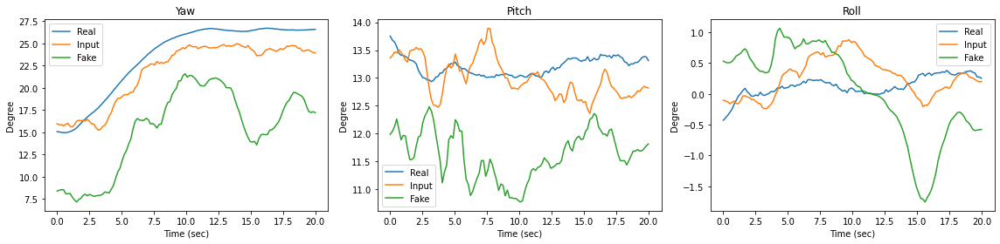

Train Epoch[011/1000] Step [01/02] d_loss: 0.0515, d_loss_real: 0.0290, d_loss_fake: 0.0203 g_loss: 0.0329 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[011/1000] Step [02/02] d_loss: 0.0476, d_loss_real: 0.0278, d_loss_fake: 0.0182 g_loss: 0.0281 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[011/1000] Step [01/01] d_loss: 2.3565, d_loss_real: 2.1645, d_loss_fake: 0.1920 g_loss: 0.1847 acc_real: 0.0000 acc_fake: 1.0000
Train Epoch[012/1000] Step [01/02] d_loss: 0.0393, d_loss_real: 0.0217, d_loss_fake: 0.0159 g_loss: 0.0254 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[012/1000] Step [02/02] d_loss: 0.0377, d_loss_real: 0.0207, d_loss_fake: 0.0155 g_loss: 0.0247 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[012/1000] Step [01/01] d_loss: 2.2802, d_loss_real: 2.0604, d_loss_fake: 0.2198 g_loss: 0.2089 acc_real: 0.0000 acc_fake: 1.0000
Train Epoch[013/1000] Step [01/02] d_loss: 0.0339, d_loss_real: 0.0186, d_loss_fake: 0.0139 g_loss: 0.0229 acc_real: 1.0000 acc_fake: 1.0000
Tra

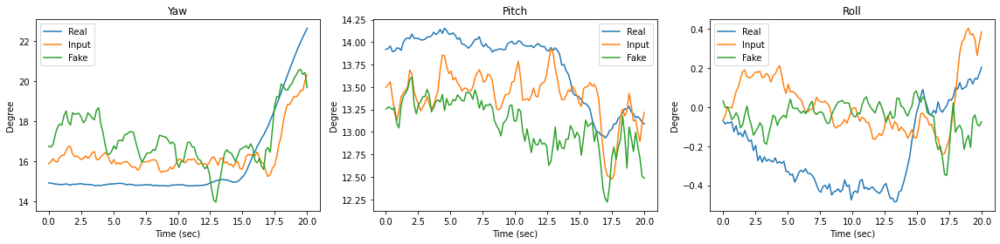

Train Epoch[021/1000] Step [01/02] d_loss: 0.0119, d_loss_real: 0.0064, d_loss_fake: 0.0051 g_loss: 0.0077 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[021/1000] Step [02/02] d_loss: 0.0117, d_loss_real: 0.0065, d_loss_fake: 0.0048 g_loss: 0.0076 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[021/1000] Step [01/01] d_loss: 2.5632, d_loss_real: 2.4553, d_loss_fake: 0.1079 g_loss: 0.1001 acc_real: 0.0000 acc_fake: 1.0000
Train Epoch[022/1000] Step [01/02] d_loss: 0.0115, d_loss_real: 0.0059, d_loss_fake: 0.0052 g_loss: 0.0073 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[022/1000] Step [02/02] d_loss: 0.0106, d_loss_real: 0.0058, d_loss_fake: 0.0044 g_loss: 0.0066 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[022/1000] Step [01/01] d_loss: 2.5463, d_loss_real: 2.4949, d_loss_fake: 0.0514 g_loss: 0.0489 acc_real: 0.0000 acc_fake: 1.0000
Train Epoch[023/1000] Step [01/02] d_loss: 0.0104, d_loss_real: 0.0053, d_loss_fake: 0.0047 g_loss: 0.0066 acc_real: 1.0000 acc_fake: 1.0000
Tra

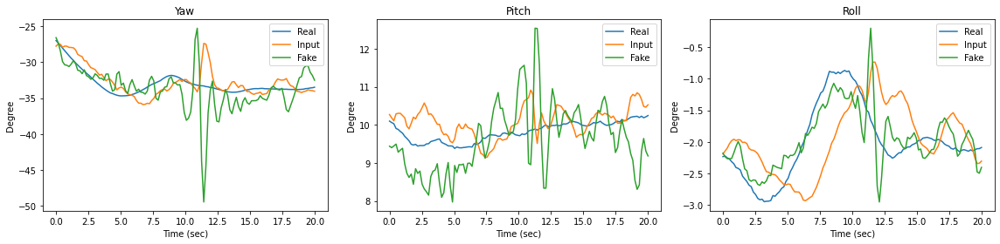

Train Epoch[031/1000] Step [01/02] d_loss: 0.0061, d_loss_real: 0.0034, d_loss_fake: 0.0026 g_loss: 0.0035 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[031/1000] Step [02/02] d_loss: 0.0059, d_loss_real: 0.0034, d_loss_fake: 0.0024 g_loss: 0.0036 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[031/1000] Step [01/01] d_loss: 1.9210, d_loss_real: 1.8787, d_loss_fake: 0.0423 g_loss: 0.0396 acc_real: 0.0889 acc_fake: 1.0000
Train Epoch[032/1000] Step [01/02] d_loss: 0.0060, d_loss_real: 0.0035, d_loss_fake: 0.0025 g_loss: 0.0041 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[032/1000] Step [02/02] d_loss: 0.0062, d_loss_real: 0.0035, d_loss_fake: 0.0026 g_loss: 0.0041 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[032/1000] Step [01/01] d_loss: 1.9444, d_loss_real: 1.9016, d_loss_fake: 0.0428 g_loss: 0.0398 acc_real: 0.0889 acc_fake: 1.0000
Train Epoch[033/1000] Step [01/02] d_loss: 0.0054, d_loss_real: 0.0032, d_loss_fake: 0.0022 g_loss: 0.0034 acc_real: 1.0000 acc_fake: 1.0000
Tra

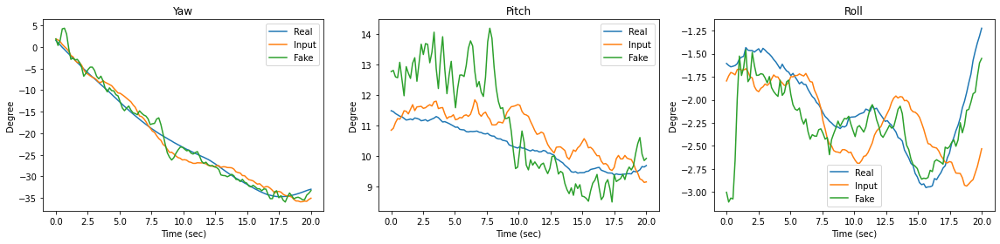

Train Epoch[041/1000] Step [01/02] d_loss: 0.0042, d_loss_real: 0.0024, d_loss_fake: 0.0017 g_loss: 0.0023 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[041/1000] Step [02/02] d_loss: 0.0045, d_loss_real: 0.0027, d_loss_fake: 0.0017 g_loss: 0.0022 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[041/1000] Step [01/01] d_loss: 1.6341, d_loss_real: 1.5931, d_loss_fake: 0.0410 g_loss: 0.0376 acc_real: 0.1778 acc_fake: 1.0000
Train Epoch[042/1000] Step [01/02] d_loss: 0.0039, d_loss_real: 0.0024, d_loss_fake: 0.0015 g_loss: 0.0021 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[042/1000] Step [02/02] d_loss: 0.0039, d_loss_real: 0.0024, d_loss_fake: 0.0015 g_loss: 0.0022 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[042/1000] Step [01/01] d_loss: 1.6758, d_loss_real: 1.6404, d_loss_fake: 0.0354 g_loss: 0.0328 acc_real: 0.1778 acc_fake: 1.0000
Train Epoch[043/1000] Step [01/02] d_loss: 0.0035, d_loss_real: 0.0022, d_loss_fake: 0.0014 g_loss: 0.0021 acc_real: 1.0000 acc_fake: 1.0000
Tra

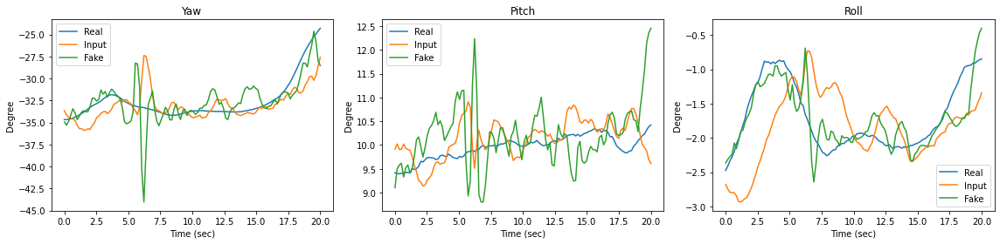

Train Epoch[051/1000] Step [01/02] d_loss: 0.0028, d_loss_real: 0.0017, d_loss_fake: 0.0011 g_loss: 0.0015 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[051/1000] Step [02/02] d_loss: 0.0028, d_loss_real: 0.0017, d_loss_fake: 0.0011 g_loss: 0.0015 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[051/1000] Step [01/01] d_loss: 1.6586, d_loss_real: 1.6247, d_loss_fake: 0.0340 g_loss: 0.0311 acc_real: 0.2222 acc_fake: 1.0000
Train Epoch[052/1000] Step [01/02] d_loss: 0.0027, d_loss_real: 0.0017, d_loss_fake: 0.0010 g_loss: 0.0014 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[052/1000] Step [02/02] d_loss: 0.0027, d_loss_real: 0.0017, d_loss_fake: 0.0010 g_loss: 0.0014 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[052/1000] Step [01/01] d_loss: 1.6529, d_loss_real: 1.6193, d_loss_fake: 0.0336 g_loss: 0.0307 acc_real: 0.2444 acc_fake: 1.0000
Train Epoch[053/1000] Step [01/02] d_loss: 0.0028, d_loss_real: 0.0016, d_loss_fake: 0.0011 g_loss: 0.0015 acc_real: 1.0000 acc_fake: 1.0000
Tra

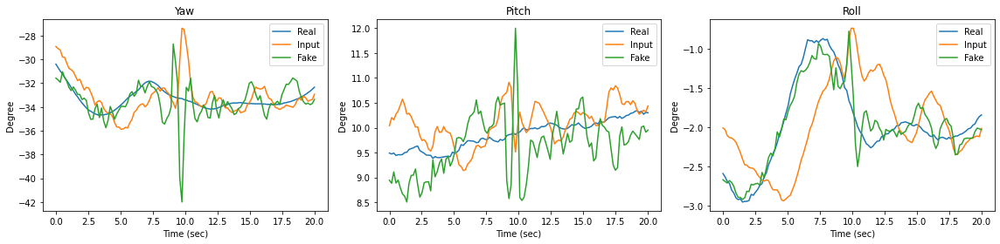

Train Epoch[061/1000] Step [01/02] d_loss: 0.0022, d_loss_real: 0.0013, d_loss_fake: 0.0008 g_loss: 0.0012 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[061/1000] Step [02/02] d_loss: 0.0022, d_loss_real: 0.0013, d_loss_fake: 0.0009 g_loss: 0.0012 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[061/1000] Step [01/01] d_loss: 1.5534, d_loss_real: 1.5219, d_loss_fake: 0.0316 g_loss: 0.0288 acc_real: 0.3111 acc_fake: 1.0000
Train Epoch[062/1000] Step [01/02] d_loss: 0.0021, d_loss_real: 0.0013, d_loss_fake: 0.0008 g_loss: 0.0012 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[062/1000] Step [02/02] d_loss: 0.0021, d_loss_real: 0.0013, d_loss_fake: 0.0008 g_loss: 0.0011 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[062/1000] Step [01/01] d_loss: 1.5203, d_loss_real: 1.4884, d_loss_fake: 0.0319 g_loss: 0.0291 acc_real: 0.3333 acc_fake: 1.0000
Train Epoch[063/1000] Step [01/02] d_loss: 0.0022, d_loss_real: 0.0013, d_loss_fake: 0.0009 g_loss: 0.0013 acc_real: 1.0000 acc_fake: 1.0000
Tra

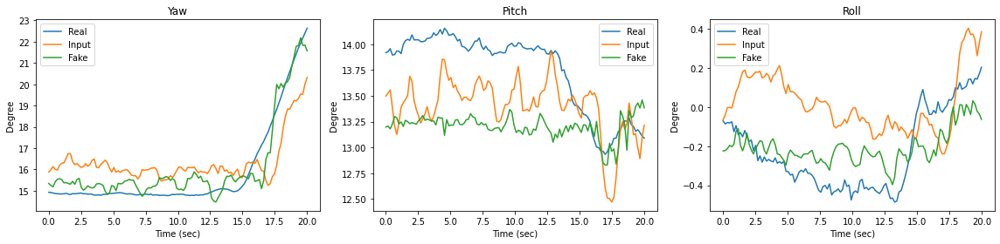

Train Epoch[071/1000] Step [01/02] d_loss: 0.0018, d_loss_real: 0.0011, d_loss_fake: 0.0008 g_loss: 0.0010 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[071/1000] Step [02/02] d_loss: 0.0018, d_loss_real: 0.0011, d_loss_fake: 0.0006 g_loss: 0.0010 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[071/1000] Step [01/01] d_loss: 1.6174, d_loss_real: 1.5872, d_loss_fake: 0.0301 g_loss: 0.0275 acc_real: 0.3111 acc_fake: 1.0000
Train Epoch[072/1000] Step [01/02] d_loss: 0.0017, d_loss_real: 0.0011, d_loss_fake: 0.0006 g_loss: 0.0010 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[072/1000] Step [02/02] d_loss: 0.0019, d_loss_real: 0.0011, d_loss_fake: 0.0008 g_loss: 0.0011 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[072/1000] Step [01/01] d_loss: 1.5716, d_loss_real: 1.5394, d_loss_fake: 0.0322 g_loss: 0.0293 acc_real: 0.3111 acc_fake: 1.0000
Train Epoch[073/1000] Step [01/02] d_loss: 0.0017, d_loss_real: 0.0011, d_loss_fake: 0.0007 g_loss: 0.0009 acc_real: 1.0000 acc_fake: 1.0000
Tra

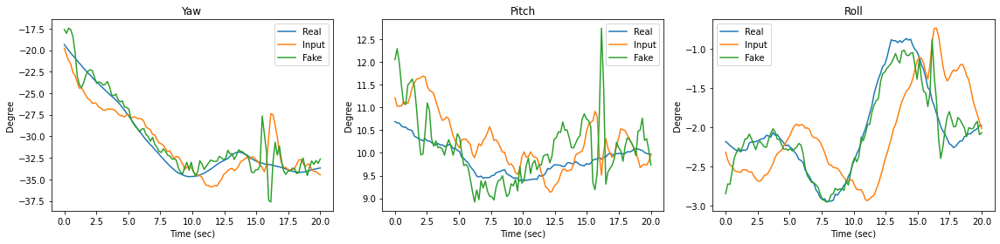

Train Epoch[081/1000] Step [01/02] d_loss: 0.0015, d_loss_real: 0.0009, d_loss_fake: 0.0006 g_loss: 0.0009 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[081/1000] Step [02/02] d_loss: 0.0015, d_loss_real: 0.0009, d_loss_fake: 0.0006 g_loss: 0.0009 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[081/1000] Step [01/01] d_loss: 1.7142, d_loss_real: 1.6819, d_loss_fake: 0.0322 g_loss: 0.0293 acc_real: 0.2889 acc_fake: 1.0000
Train Epoch[082/1000] Step [01/02] d_loss: 0.0015, d_loss_real: 0.0009, d_loss_fake: 0.0006 g_loss: 0.0009 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[082/1000] Step [02/02] d_loss: 0.0015, d_loss_real: 0.0009, d_loss_fake: 0.0006 g_loss: 0.0009 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[082/1000] Step [01/01] d_loss: 1.6644, d_loss_real: 1.6302, d_loss_fake: 0.0342 g_loss: 0.0311 acc_real: 0.3111 acc_fake: 1.0000
Train Epoch[083/1000] Step [01/02] d_loss: 0.0015, d_loss_real: 0.0009, d_loss_fake: 0.0006 g_loss: 0.0009 acc_real: 1.0000 acc_fake: 1.0000
Tra

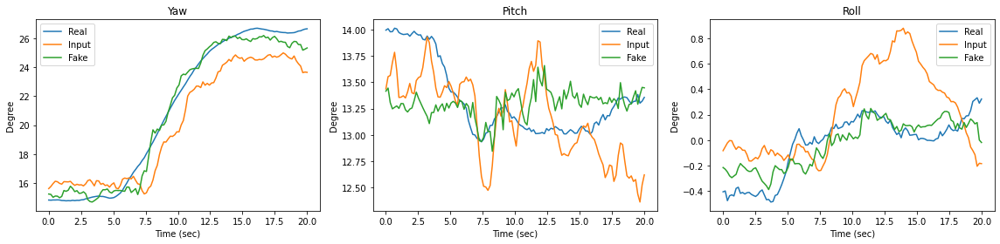

Train Epoch[091/1000] Step [01/02] d_loss: 0.0013, d_loss_real: 0.0008, d_loss_fake: 0.0005 g_loss: 0.0007 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[091/1000] Step [02/02] d_loss: 0.0014, d_loss_real: 0.0009, d_loss_fake: 0.0006 g_loss: 0.0008 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[091/1000] Step [01/01] d_loss: 1.5546, d_loss_real: 1.5248, d_loss_fake: 0.0297 g_loss: 0.0270 acc_real: 0.3333 acc_fake: 1.0000
Train Epoch[092/1000] Step [01/02] d_loss: 0.0013, d_loss_real: 0.0008, d_loss_fake: 0.0005 g_loss: 0.0008 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[092/1000] Step [02/02] d_loss: 0.0013, d_loss_real: 0.0008, d_loss_fake: 0.0005 g_loss: 0.0008 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[092/1000] Step [01/01] d_loss: 1.6351, d_loss_real: 1.6073, d_loss_fake: 0.0278 g_loss: 0.0253 acc_real: 0.3111 acc_fake: 1.0000
Train Epoch[093/1000] Step [01/02] d_loss: 0.0012, d_loss_real: 0.0007, d_loss_fake: 0.0005 g_loss: 0.0007 acc_real: 1.0000 acc_fake: 1.0000
Tra

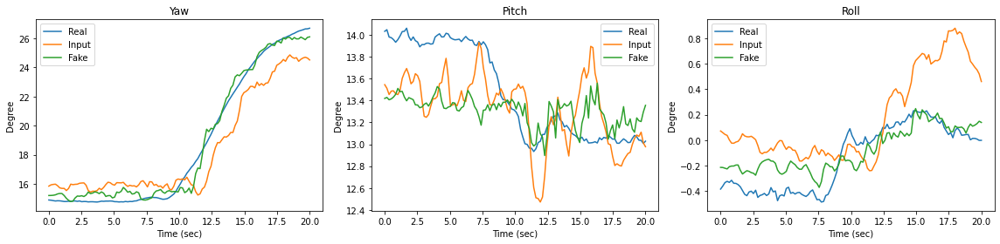

Train Epoch[101/1000] Step [01/02] d_loss: 0.0011, d_loss_real: 0.0007, d_loss_fake: 0.0004 g_loss: 0.0006 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[101/1000] Step [02/02] d_loss: 0.0011, d_loss_real: 0.0007, d_loss_fake: 0.0004 g_loss: 0.0007 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[101/1000] Step [01/01] d_loss: 1.6324, d_loss_real: 1.6049, d_loss_fake: 0.0275 g_loss: 0.0250 acc_real: 0.3333 acc_fake: 1.0000
Train Epoch[102/1000] Step [01/02] d_loss: 0.0012, d_loss_real: 0.0007, d_loss_fake: 0.0005 g_loss: 0.0007 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[102/1000] Step [02/02] d_loss: 0.0012, d_loss_real: 0.0007, d_loss_fake: 0.0005 g_loss: 0.0007 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[102/1000] Step [01/01] d_loss: 1.6454, d_loss_real: 1.6191, d_loss_fake: 0.0263 g_loss: 0.0239 acc_real: 0.3333 acc_fake: 1.0000
Train Epoch[103/1000] Step [01/02] d_loss: 0.0011, d_loss_real: 0.0007, d_loss_fake: 0.0004 g_loss: 0.0006 acc_real: 1.0000 acc_fake: 1.0000
Tra

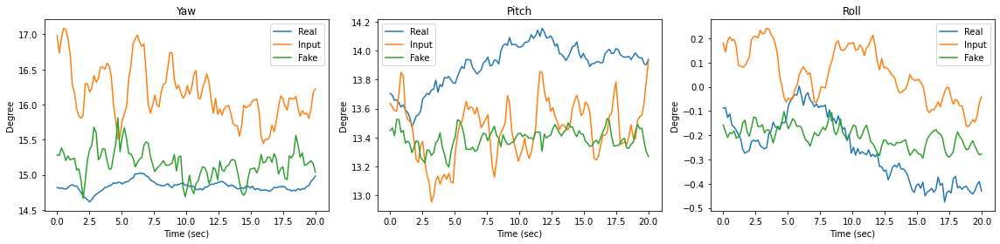

Train Epoch[111/1000] Step [01/02] d_loss: 0.0010, d_loss_real: 0.0006, d_loss_fake: 0.0004 g_loss: 0.0007 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[111/1000] Step [02/02] d_loss: 0.0010, d_loss_real: 0.0006, d_loss_fake: 0.0004 g_loss: 0.0007 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[111/1000] Step [01/01] d_loss: 1.5919, d_loss_real: 1.5668, d_loss_fake: 0.0251 g_loss: 0.0228 acc_real: 0.3333 acc_fake: 1.0000
Train Epoch[112/1000] Step [01/02] d_loss: 0.0009, d_loss_real: 0.0006, d_loss_fake: 0.0003 g_loss: 0.0006 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[112/1000] Step [02/02] d_loss: 0.0010, d_loss_real: 0.0006, d_loss_fake: 0.0004 g_loss: 0.0007 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[112/1000] Step [01/01] d_loss: 1.6984, d_loss_real: 1.6742, d_loss_fake: 0.0242 g_loss: 0.0220 acc_real: 0.3111 acc_fake: 1.0000
Train Epoch[113/1000] Step [01/02] d_loss: 0.0010, d_loss_real: 0.0006, d_loss_fake: 0.0004 g_loss: 0.0007 acc_real: 1.0000 acc_fake: 1.0000
Tra

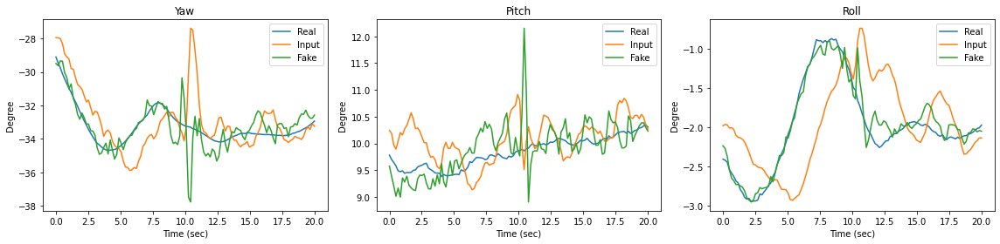

Train Epoch[121/1000] Step [01/02] d_loss: 0.0009, d_loss_real: 0.0005, d_loss_fake: 0.0004 g_loss: 0.0006 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[121/1000] Step [02/02] d_loss: 0.0010, d_loss_real: 0.0006, d_loss_fake: 0.0004 g_loss: 0.0007 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[121/1000] Step [01/01] d_loss: 1.6006, d_loss_real: 1.5749, d_loss_fake: 0.0257 g_loss: 0.0234 acc_real: 0.3333 acc_fake: 1.0000
Train Epoch[122/1000] Step [01/02] d_loss: 0.0008, d_loss_real: 0.0005, d_loss_fake: 0.0003 g_loss: 0.0005 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[122/1000] Step [02/02] d_loss: 0.0009, d_loss_real: 0.0006, d_loss_fake: 0.0003 g_loss: 0.0006 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[122/1000] Step [01/01] d_loss: 1.6610, d_loss_real: 1.6368, d_loss_fake: 0.0242 g_loss: 0.0220 acc_real: 0.3333 acc_fake: 1.0000
Train Epoch[123/1000] Step [01/02] d_loss: 0.0008, d_loss_real: 0.0005, d_loss_fake: 0.0003 g_loss: 0.0005 acc_real: 1.0000 acc_fake: 1.0000
Tra

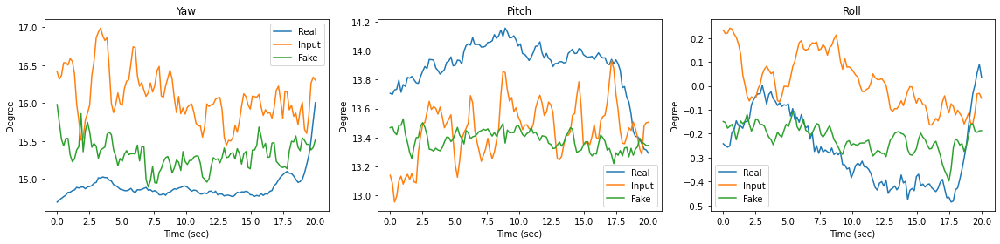

Train Epoch[131/1000] Step [01/02] d_loss: 0.0007, d_loss_real: 0.0005, d_loss_fake: 0.0003 g_loss: 0.0004 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[131/1000] Step [02/02] d_loss: 0.0008, d_loss_real: 0.0005, d_loss_fake: 0.0003 g_loss: 0.0005 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[131/1000] Step [01/01] d_loss: 1.7292, d_loss_real: 1.7044, d_loss_fake: 0.0248 g_loss: 0.0225 acc_real: 0.3111 acc_fake: 1.0000
Train Epoch[132/1000] Step [01/02] d_loss: 0.0007, d_loss_real: 0.0005, d_loss_fake: 0.0003 g_loss: 0.0004 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[132/1000] Step [02/02] d_loss: 0.0008, d_loss_real: 0.0005, d_loss_fake: 0.0003 g_loss: 0.0005 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[132/1000] Step [01/01] d_loss: 1.7098, d_loss_real: 1.6825, d_loss_fake: 0.0273 g_loss: 0.0248 acc_real: 0.3111 acc_fake: 1.0000
Train Epoch[133/1000] Step [01/02] d_loss: 0.0008, d_loss_real: 0.0005, d_loss_fake: 0.0003 g_loss: 0.0005 acc_real: 1.0000 acc_fake: 1.0000
Tra

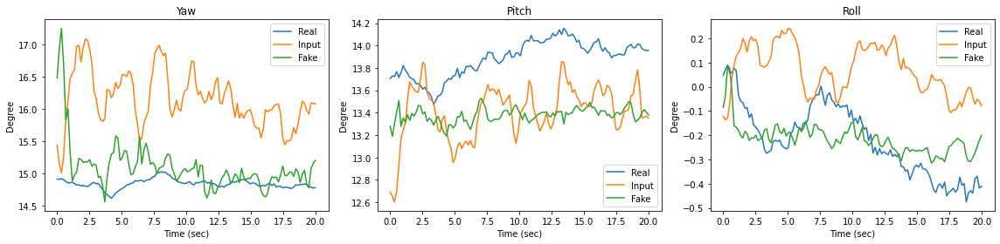

Train Epoch[141/1000] Step [01/02] d_loss: 0.0007, d_loss_real: 0.0004, d_loss_fake: 0.0003 g_loss: 0.0005 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[141/1000] Step [02/02] d_loss: 0.0008, d_loss_real: 0.0005, d_loss_fake: 0.0003 g_loss: 0.0006 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[141/1000] Step [01/01] d_loss: 1.7391, d_loss_real: 1.7180, d_loss_fake: 0.0211 g_loss: 0.0191 acc_real: 0.3111 acc_fake: 1.0000
Train Epoch[142/1000] Step [01/02] d_loss: 0.0007, d_loss_real: 0.0004, d_loss_fake: 0.0002 g_loss: 0.0004 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[142/1000] Step [02/02] d_loss: 0.0007, d_loss_real: 0.0004, d_loss_fake: 0.0002 g_loss: 0.0004 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[142/1000] Step [01/01] d_loss: 1.6104, d_loss_real: 1.5863, d_loss_fake: 0.0241 g_loss: 0.0219 acc_real: 0.3333 acc_fake: 1.0000
Train Epoch[143/1000] Step [01/02] d_loss: 0.0006, d_loss_real: 0.0004, d_loss_fake: 0.0003 g_loss: 0.0004 acc_real: 1.0000 acc_fake: 1.0000
Tra

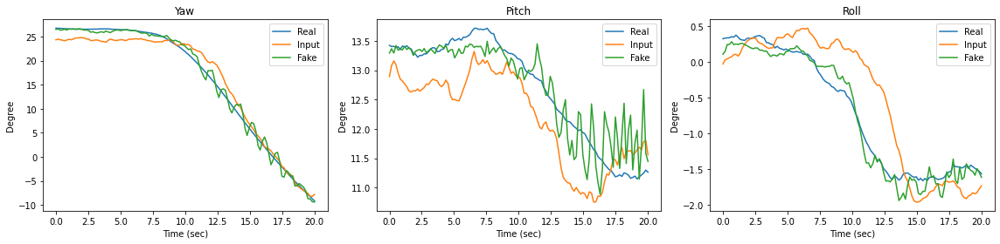

Train Epoch[151/1000] Step [01/02] d_loss: 0.0006, d_loss_real: 0.0004, d_loss_fake: 0.0002 g_loss: 0.0004 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[151/1000] Step [02/02] d_loss: 0.0006, d_loss_real: 0.0004, d_loss_fake: 0.0002 g_loss: 0.0004 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[151/1000] Step [01/01] d_loss: 1.5966, d_loss_real: 1.5722, d_loss_fake: 0.0244 g_loss: 0.0221 acc_real: 0.3333 acc_fake: 1.0000
Train Epoch[152/1000] Step [01/02] d_loss: 0.0006, d_loss_real: 0.0004, d_loss_fake: 0.0002 g_loss: 0.0004 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[152/1000] Step [02/02] d_loss: 0.0006, d_loss_real: 0.0004, d_loss_fake: 0.0002 g_loss: 0.0004 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[152/1000] Step [01/01] d_loss: 1.5473, d_loss_real: 1.5216, d_loss_fake: 0.0257 g_loss: 0.0233 acc_real: 0.3556 acc_fake: 1.0000
Train Epoch[153/1000] Step [01/02] d_loss: 0.0006, d_loss_real: 0.0004, d_loss_fake: 0.0002 g_loss: 0.0004 acc_real: 1.0000 acc_fake: 1.0000
Tra

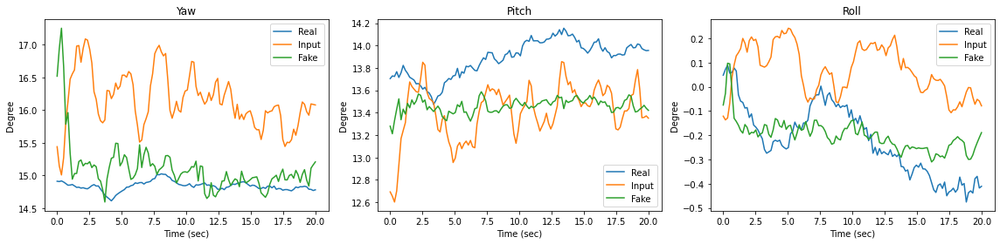

Train Epoch[161/1000] Step [01/02] d_loss: 0.0006, d_loss_real: 0.0003, d_loss_fake: 0.0002 g_loss: 0.0004 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[161/1000] Step [02/02] d_loss: 0.0006, d_loss_real: 0.0004, d_loss_fake: 0.0002 g_loss: 0.0004 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[161/1000] Step [01/01] d_loss: 1.5710, d_loss_real: 1.5470, d_loss_fake: 0.0240 g_loss: 0.0217 acc_real: 0.3556 acc_fake: 1.0000
Train Epoch[162/1000] Step [01/02] d_loss: 0.0005, d_loss_real: 0.0003, d_loss_fake: 0.0002 g_loss: 0.0003 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[162/1000] Step [02/02] d_loss: 0.0006, d_loss_real: 0.0003, d_loss_fake: 0.0002 g_loss: 0.0004 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[162/1000] Step [01/01] d_loss: 1.5831, d_loss_real: 1.5602, d_loss_fake: 0.0229 g_loss: 0.0208 acc_real: 0.3333 acc_fake: 1.0000
Train Epoch[163/1000] Step [01/02] d_loss: 0.0006, d_loss_real: 0.0003, d_loss_fake: 0.0002 g_loss: 0.0004 acc_real: 1.0000 acc_fake: 1.0000
Tra

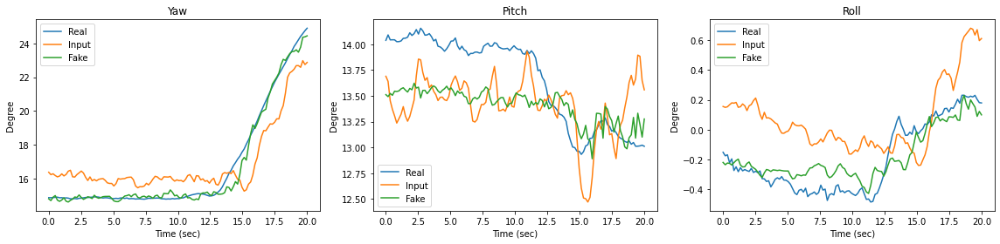

Train Epoch[171/1000] Step [01/02] d_loss: 0.0005, d_loss_real: 0.0003, d_loss_fake: 0.0002 g_loss: 0.0005 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[171/1000] Step [02/02] d_loss: 0.0005, d_loss_real: 0.0003, d_loss_fake: 0.0002 g_loss: 0.0005 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[171/1000] Step [01/01] d_loss: 2.5038, d_loss_real: 2.4763, d_loss_fake: 0.0275 g_loss: 0.0251 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[172/1000] Step [01/02] d_loss: 0.0005, d_loss_real: 0.0003, d_loss_fake: 0.0002 g_loss: 0.0006 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[172/1000] Step [02/02] d_loss: 0.0005, d_loss_real: 0.0003, d_loss_fake: 0.0002 g_loss: 0.0005 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[172/1000] Step [01/01] d_loss: 2.2804, d_loss_real: 2.2580, d_loss_fake: 0.0224 g_loss: 0.0204 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[173/1000] Step [01/02] d_loss: 0.0005, d_loss_real: 0.0003, d_loss_fake: 0.0002 g_loss: 0.0004 acc_real: 1.0000 acc_fake: 1.0000
Tra

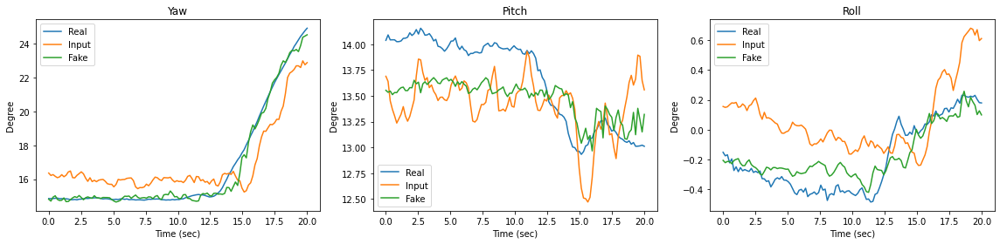

Train Epoch[181/1000] Step [01/02] d_loss: 0.0005, d_loss_real: 0.0003, d_loss_fake: 0.0002 g_loss: 0.0004 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[181/1000] Step [02/02] d_loss: 0.0005, d_loss_real: 0.0003, d_loss_fake: 0.0002 g_loss: 0.0004 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[181/1000] Step [01/01] d_loss: 2.1936, d_loss_real: 2.1680, d_loss_fake: 0.0256 g_loss: 0.0232 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[182/1000] Step [01/02] d_loss: 0.0005, d_loss_real: 0.0003, d_loss_fake: 0.0002 g_loss: 0.0003 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[182/1000] Step [02/02] d_loss: 0.0005, d_loss_real: 0.0003, d_loss_fake: 0.0002 g_loss: 0.0005 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[182/1000] Step [01/01] d_loss: 2.0369, d_loss_real: 2.0098, d_loss_fake: 0.0272 g_loss: 0.0246 acc_real: 0.2000 acc_fake: 1.0000
Train Epoch[183/1000] Step [01/02] d_loss: 0.0005, d_loss_real: 0.0003, d_loss_fake: 0.0002 g_loss: 0.0004 acc_real: 1.0000 acc_fake: 1.0000
Tra

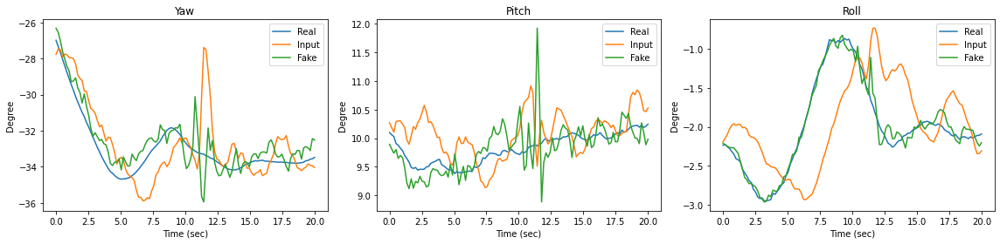

Train Epoch[191/1000] Step [01/02] d_loss: 0.0004, d_loss_real: 0.0003, d_loss_fake: 0.0002 g_loss: 0.0003 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[191/1000] Step [02/02] d_loss: 0.0005, d_loss_real: 0.0003, d_loss_fake: 0.0002 g_loss: 0.0004 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[191/1000] Step [01/01] d_loss: 1.9664, d_loss_real: 1.9453, d_loss_fake: 0.0211 g_loss: 0.0191 acc_real: 0.2444 acc_fake: 1.0000
Train Epoch[192/1000] Step [01/02] d_loss: 0.0004, d_loss_real: 0.0003, d_loss_fake: 0.0002 g_loss: 0.0004 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[192/1000] Step [02/02] d_loss: 0.0004, d_loss_real: 0.0003, d_loss_fake: 0.0002 g_loss: 0.0003 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[192/1000] Step [01/01] d_loss: 2.0484, d_loss_real: 2.0269, d_loss_fake: 0.0215 g_loss: 0.0195 acc_real: 0.1778 acc_fake: 1.0000
Train Epoch[193/1000] Step [01/02] d_loss: 0.0005, d_loss_real: 0.0003, d_loss_fake: 0.0002 g_loss: 0.0005 acc_real: 1.0000 acc_fake: 1.0000
Tra

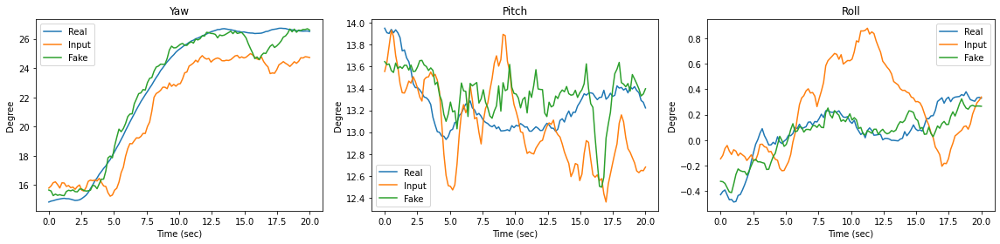

Train Epoch[201/1000] Step [01/02] d_loss: 0.0004, d_loss_real: 0.0002, d_loss_fake: 0.0002 g_loss: 0.0003 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[201/1000] Step [02/02] d_loss: 0.0005, d_loss_real: 0.0003, d_loss_fake: 0.0002 g_loss: 0.0004 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[201/1000] Step [01/01] d_loss: 2.1513, d_loss_real: 2.1264, d_loss_fake: 0.0250 g_loss: 0.0226 acc_real: 0.1778 acc_fake: 1.0000
Train Epoch[202/1000] Step [01/02] d_loss: 0.0004, d_loss_real: 0.0002, d_loss_fake: 0.0001 g_loss: 0.0003 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[202/1000] Step [02/02] d_loss: 0.0004, d_loss_real: 0.0002, d_loss_fake: 0.0001 g_loss: 0.0003 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[202/1000] Step [01/01] d_loss: 2.1918, d_loss_real: 2.1709, d_loss_fake: 0.0209 g_loss: 0.0189 acc_real: 0.1556 acc_fake: 1.0000
Train Epoch[203/1000] Step [01/02] d_loss: 0.0004, d_loss_real: 0.0002, d_loss_fake: 0.0001 g_loss: 0.0003 acc_real: 1.0000 acc_fake: 1.0000
Tra

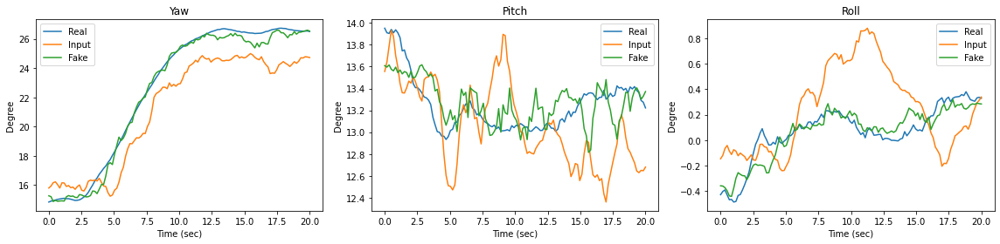

Train Epoch[211/1000] Step [01/02] d_loss: 0.0004, d_loss_real: 0.0002, d_loss_fake: 0.0001 g_loss: 0.0002 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[211/1000] Step [02/02] d_loss: 0.0004, d_loss_real: 0.0002, d_loss_fake: 0.0001 g_loss: 0.0002 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[211/1000] Step [01/01] d_loss: 1.8968, d_loss_real: 1.8709, d_loss_fake: 0.0259 g_loss: 0.0234 acc_real: 0.2889 acc_fake: 1.0000
Train Epoch[212/1000] Step [01/02] d_loss: 0.0004, d_loss_real: 0.0002, d_loss_fake: 0.0002 g_loss: 0.0003 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[212/1000] Step [02/02] d_loss: 0.0004, d_loss_real: 0.0002, d_loss_fake: 0.0002 g_loss: 0.0004 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[212/1000] Step [01/01] d_loss: 1.8997, d_loss_real: 1.8703, d_loss_fake: 0.0294 g_loss: 0.0266 acc_real: 0.2889 acc_fake: 1.0000
Train Epoch[213/1000] Step [01/02] d_loss: 0.0004, d_loss_real: 0.0002, d_loss_fake: 0.0002 g_loss: 0.0004 acc_real: 1.0000 acc_fake: 1.0000
Tra

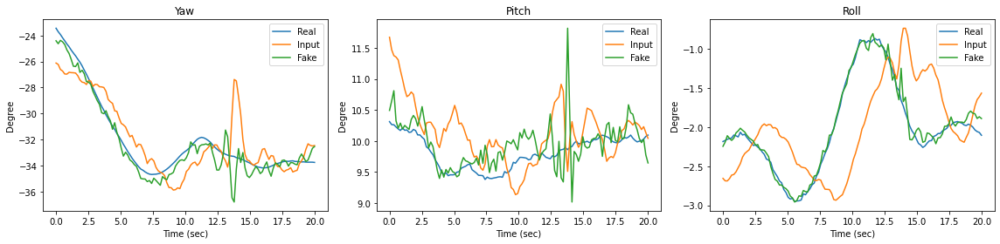

Train Epoch[221/1000] Step [01/02] d_loss: 0.0003, d_loss_real: 0.0002, d_loss_fake: 0.0001 g_loss: 0.0002 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[221/1000] Step [02/02] d_loss: 0.0003, d_loss_real: 0.0002, d_loss_fake: 0.0001 g_loss: 0.0003 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[221/1000] Step [01/01] d_loss: 2.0209, d_loss_real: 1.9982, d_loss_fake: 0.0227 g_loss: 0.0205 acc_real: 0.2444 acc_fake: 1.0000
Train Epoch[222/1000] Step [01/02] d_loss: 0.0003, d_loss_real: 0.0002, d_loss_fake: 0.0001 g_loss: 0.0002 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[222/1000] Step [02/02] d_loss: 0.0003, d_loss_real: 0.0002, d_loss_fake: 0.0001 g_loss: 0.0002 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[222/1000] Step [01/01] d_loss: 1.9372, d_loss_real: 1.9160, d_loss_fake: 0.0212 g_loss: 0.0192 acc_real: 0.2667 acc_fake: 1.0000
Train Epoch[223/1000] Step [01/02] d_loss: 0.0003, d_loss_real: 0.0002, d_loss_fake: 0.0001 g_loss: 0.0003 acc_real: 1.0000 acc_fake: 1.0000
Tra

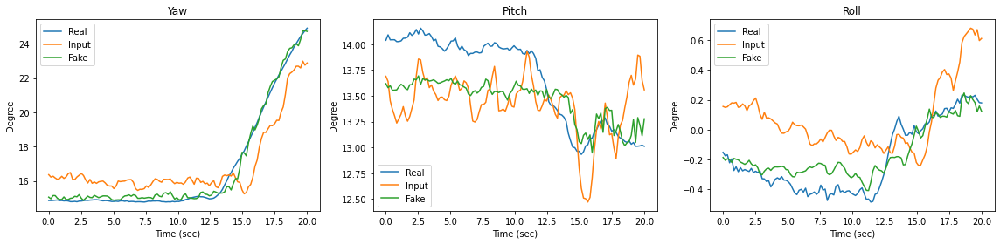

Train Epoch[231/1000] Step [01/02] d_loss: 0.0003, d_loss_real: 0.0002, d_loss_fake: 0.0001 g_loss: 0.0002 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[231/1000] Step [02/02] d_loss: 0.0003, d_loss_real: 0.0002, d_loss_fake: 0.0001 g_loss: 0.0003 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[231/1000] Step [01/01] d_loss: 1.8328, d_loss_real: 1.8057, d_loss_fake: 0.0271 g_loss: 0.0245 acc_real: 0.2889 acc_fake: 1.0000
Train Epoch[232/1000] Step [01/02] d_loss: 0.0003, d_loss_real: 0.0002, d_loss_fake: 0.0001 g_loss: 0.0003 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[232/1000] Step [02/02] d_loss: 0.0004, d_loss_real: 0.0002, d_loss_fake: 0.0002 g_loss: 0.0005 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[232/1000] Step [01/01] d_loss: 1.8678, d_loss_real: 1.8410, d_loss_fake: 0.0268 g_loss: 0.0242 acc_real: 0.2889 acc_fake: 1.0000
Train Epoch[233/1000] Step [01/02] d_loss: 0.0003, d_loss_real: 0.0002, d_loss_fake: 0.0001 g_loss: 0.0002 acc_real: 1.0000 acc_fake: 1.0000
Tra

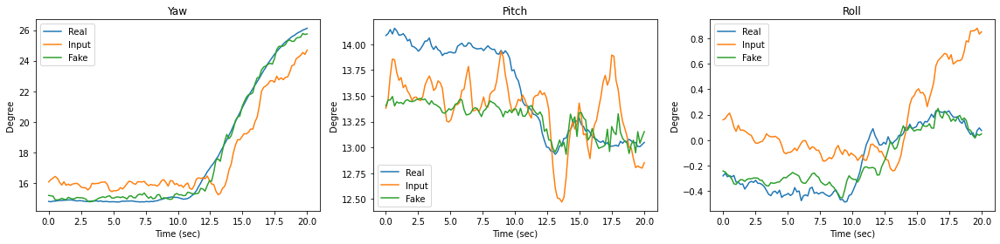

Train Epoch[241/1000] Step [01/02] d_loss: 0.0003, d_loss_real: 0.0002, d_loss_fake: 0.0001 g_loss: 0.0003 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[241/1000] Step [02/02] d_loss: 0.0004, d_loss_real: 0.0002, d_loss_fake: 0.0001 g_loss: 0.0003 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[241/1000] Step [01/01] d_loss: 2.2686, d_loss_real: 2.2492, d_loss_fake: 0.0194 g_loss: 0.0176 acc_real: 0.1778 acc_fake: 1.0000
Train Epoch[242/1000] Step [01/02] d_loss: 0.0003, d_loss_real: 0.0002, d_loss_fake: 0.0001 g_loss: 0.0002 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[242/1000] Step [02/02] d_loss: 0.0003, d_loss_real: 0.0002, d_loss_fake: 0.0001 g_loss: 0.0002 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[242/1000] Step [01/01] d_loss: 2.1647, d_loss_real: 2.1377, d_loss_fake: 0.0269 g_loss: 0.0244 acc_real: 0.1778 acc_fake: 1.0000
Train Epoch[243/1000] Step [01/02] d_loss: 0.0003, d_loss_real: 0.0002, d_loss_fake: 0.0001 g_loss: 0.0002 acc_real: 1.0000 acc_fake: 1.0000
Tra

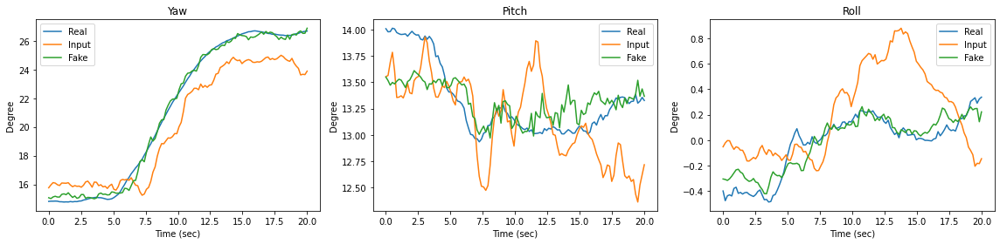

Train Epoch[251/1000] Step [01/02] d_loss: 0.0003, d_loss_real: 0.0002, d_loss_fake: 0.0001 g_loss: 0.0002 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[251/1000] Step [02/02] d_loss: 0.0003, d_loss_real: 0.0002, d_loss_fake: 0.0001 g_loss: 0.0002 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[251/1000] Step [01/01] d_loss: 2.1441, d_loss_real: 2.1267, d_loss_fake: 0.0173 g_loss: 0.0157 acc_real: 0.1556 acc_fake: 1.0000
Train Epoch[252/1000] Step [01/02] d_loss: 0.0003, d_loss_real: 0.0002, d_loss_fake: 0.0001 g_loss: 0.0003 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[252/1000] Step [02/02] d_loss: 0.0003, d_loss_real: 0.0002, d_loss_fake: 0.0001 g_loss: 0.0003 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[252/1000] Step [01/01] d_loss: 2.1607, d_loss_real: 2.1420, d_loss_fake: 0.0187 g_loss: 0.0169 acc_real: 0.1778 acc_fake: 1.0000
Train Epoch[253/1000] Step [01/02] d_loss: 0.0003, d_loss_real: 0.0002, d_loss_fake: 0.0001 g_loss: 0.0002 acc_real: 1.0000 acc_fake: 1.0000
Tra

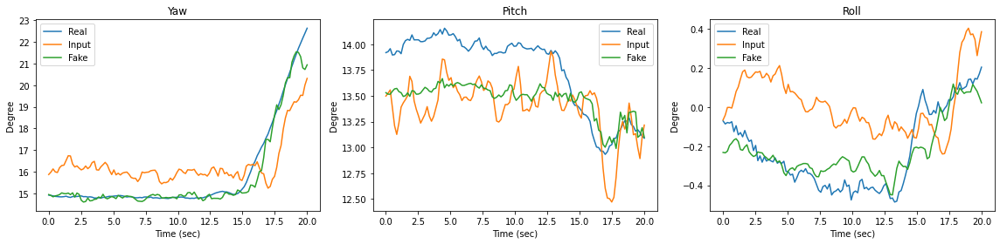

Train Epoch[261/1000] Step [01/02] d_loss: 0.0003, d_loss_real: 0.0002, d_loss_fake: 0.0001 g_loss: 0.0002 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[261/1000] Step [02/02] d_loss: 0.0003, d_loss_real: 0.0002, d_loss_fake: 0.0001 g_loss: 0.0002 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[261/1000] Step [01/01] d_loss: 1.9920, d_loss_real: 1.9714, d_loss_fake: 0.0206 g_loss: 0.0187 acc_real: 0.2667 acc_fake: 1.0000
Train Epoch[262/1000] Step [01/02] d_loss: 0.0003, d_loss_real: 0.0002, d_loss_fake: 0.0001 g_loss: 0.0002 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[262/1000] Step [02/02] d_loss: 0.0003, d_loss_real: 0.0002, d_loss_fake: 0.0001 g_loss: 0.0002 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[262/1000] Step [01/01] d_loss: 2.0788, d_loss_real: 2.0602, d_loss_fake: 0.0186 g_loss: 0.0168 acc_real: 0.2222 acc_fake: 1.0000
Train Epoch[263/1000] Step [01/02] d_loss: 0.0002, d_loss_real: 0.0002, d_loss_fake: 0.0001 g_loss: 0.0002 acc_real: 1.0000 acc_fake: 1.0000
Tra

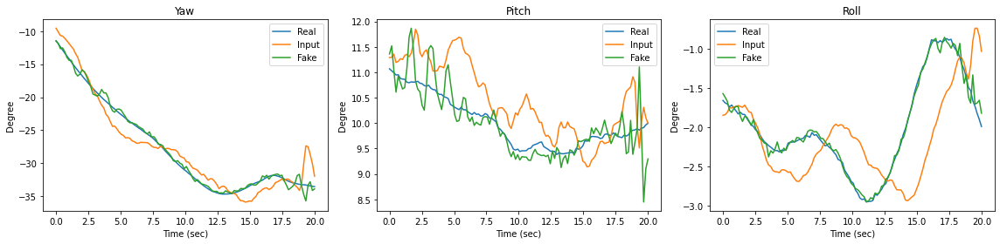

Train Epoch[271/1000] Step [01/02] d_loss: 0.0003, d_loss_real: 0.0002, d_loss_fake: 0.0001 g_loss: 0.0002 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[271/1000] Step [02/02] d_loss: 0.0003, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0002 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[271/1000] Step [01/01] d_loss: 1.8635, d_loss_real: 1.8388, d_loss_fake: 0.0247 g_loss: 0.0223 acc_real: 0.2889 acc_fake: 1.0000
Train Epoch[272/1000] Step [01/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0002 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[272/1000] Step [02/02] d_loss: 0.0003, d_loss_real: 0.0002, d_loss_fake: 0.0001 g_loss: 0.0002 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[272/1000] Step [01/01] d_loss: 1.8385, d_loss_real: 1.8098, d_loss_fake: 0.0287 g_loss: 0.0259 acc_real: 0.2889 acc_fake: 1.0000
Train Epoch[273/1000] Step [01/02] d_loss: 0.0003, d_loss_real: 0.0002, d_loss_fake: 0.0001 g_loss: 0.0002 acc_real: 1.0000 acc_fake: 1.0000
Tra

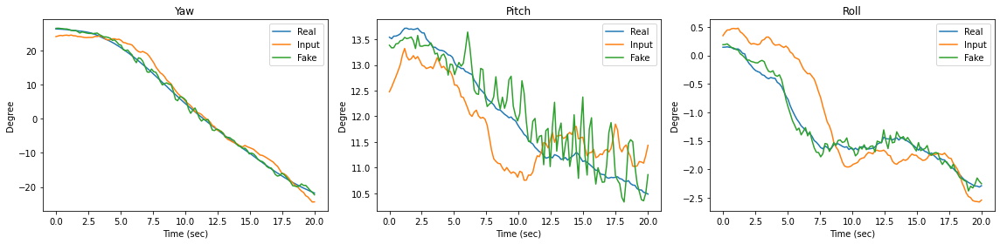

Train Epoch[281/1000] Step [01/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0002 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[281/1000] Step [02/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0002 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[281/1000] Step [01/01] d_loss: 1.9854, d_loss_real: 1.9620, d_loss_fake: 0.0234 g_loss: 0.0211 acc_real: 0.2667 acc_fake: 1.0000
Train Epoch[282/1000] Step [01/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0002 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[282/1000] Step [02/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0002 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[282/1000] Step [01/01] d_loss: 1.9077, d_loss_real: 1.8793, d_loss_fake: 0.0284 g_loss: 0.0256 acc_real: 0.2889 acc_fake: 1.0000
Train Epoch[283/1000] Step [01/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0002 acc_real: 1.0000 acc_fake: 1.0000
Tra

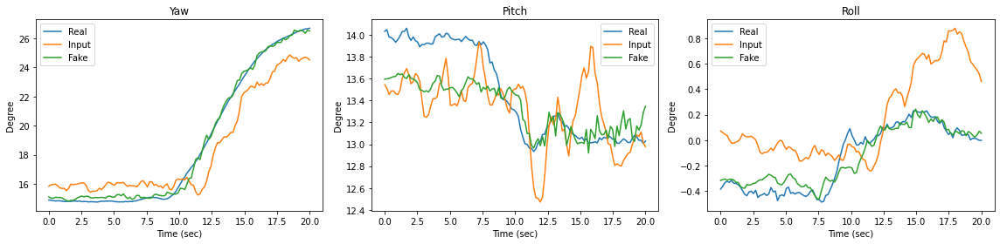

Train Epoch[291/1000] Step [01/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0002 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[291/1000] Step [02/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0002 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[291/1000] Step [01/01] d_loss: 2.0288, d_loss_real: 2.0098, d_loss_fake: 0.0191 g_loss: 0.0172 acc_real: 0.2667 acc_fake: 1.0000
Train Epoch[292/1000] Step [01/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0002 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[292/1000] Step [02/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0002 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[292/1000] Step [01/01] d_loss: 1.8392, d_loss_real: 1.8168, d_loss_fake: 0.0224 g_loss: 0.0202 acc_real: 0.3111 acc_fake: 1.0000
Train Epoch[293/1000] Step [01/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Tra

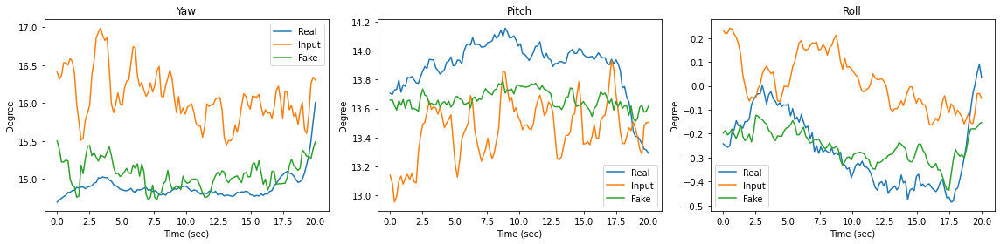

Train Epoch[301/1000] Step [01/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[301/1000] Step [02/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[301/1000] Step [01/01] d_loss: 1.9727, d_loss_real: 1.9537, d_loss_fake: 0.0190 g_loss: 0.0172 acc_real: 0.2667 acc_fake: 1.0000
Train Epoch[302/1000] Step [01/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[302/1000] Step [02/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[302/1000] Step [01/01] d_loss: 1.9578, d_loss_real: 1.9351, d_loss_fake: 0.0227 g_loss: 0.0205 acc_real: 0.2889 acc_fake: 1.0000
Train Epoch[303/1000] Step [01/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Tra

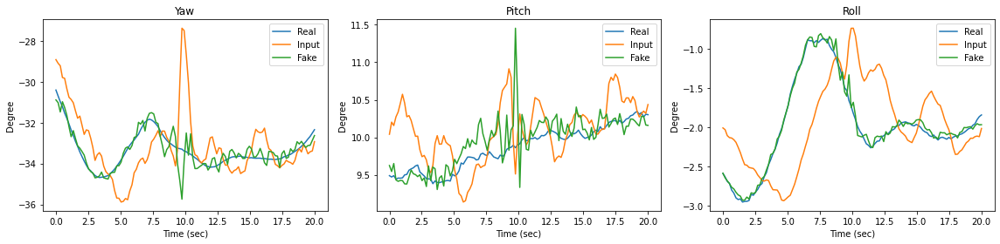

Train Epoch[311/1000] Step [01/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[311/1000] Step [02/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0002 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[311/1000] Step [01/01] d_loss: 2.0342, d_loss_real: 2.0157, d_loss_fake: 0.0184 g_loss: 0.0166 acc_real: 0.2667 acc_fake: 1.0000
Train Epoch[312/1000] Step [01/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[312/1000] Step [02/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0002 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[312/1000] Step [01/01] d_loss: 1.9623, d_loss_real: 1.9417, d_loss_fake: 0.0206 g_loss: 0.0186 acc_real: 0.2889 acc_fake: 1.0000
Train Epoch[313/1000] Step [01/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Tra

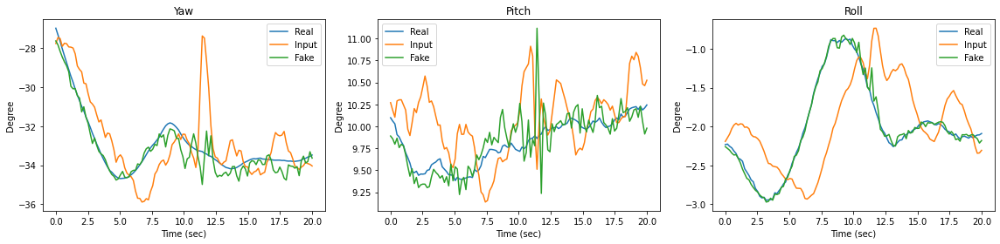

Train Epoch[321/1000] Step [01/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[321/1000] Step [02/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0002 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[321/1000] Step [01/01] d_loss: 1.8839, d_loss_real: 1.8622, d_loss_fake: 0.0217 g_loss: 0.0196 acc_real: 0.2889 acc_fake: 1.0000
Train Epoch[322/1000] Step [01/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[322/1000] Step [02/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0002 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[322/1000] Step [01/01] d_loss: 1.9498, d_loss_real: 1.9266, d_loss_fake: 0.0232 g_loss: 0.0209 acc_real: 0.2889 acc_fake: 1.0000
Train Epoch[323/1000] Step [01/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Tra

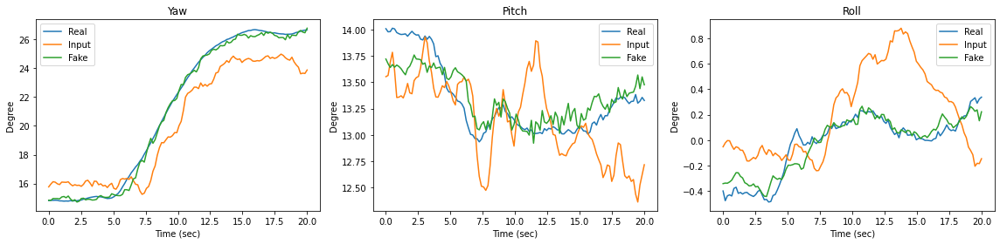

Train Epoch[331/1000] Step [01/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[331/1000] Step [02/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[331/1000] Step [01/01] d_loss: 1.9368, d_loss_real: 1.9158, d_loss_fake: 0.0210 g_loss: 0.0189 acc_real: 0.2889 acc_fake: 1.0000
Train Epoch[332/1000] Step [01/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[332/1000] Step [02/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[332/1000] Step [01/01] d_loss: 1.9840, d_loss_real: 1.9625, d_loss_fake: 0.0215 g_loss: 0.0194 acc_real: 0.2667 acc_fake: 1.0000
Train Epoch[333/1000] Step [01/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Tra

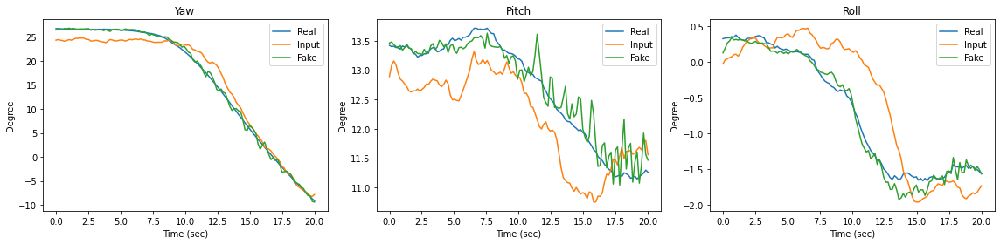

Train Epoch[341/1000] Step [01/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[341/1000] Step [02/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[341/1000] Step [01/01] d_loss: 1.9396, d_loss_real: 1.9204, d_loss_fake: 0.0192 g_loss: 0.0173 acc_real: 0.2889 acc_fake: 1.0000
Train Epoch[342/1000] Step [01/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[342/1000] Step [02/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[342/1000] Step [01/01] d_loss: 1.8795, d_loss_real: 1.8545, d_loss_fake: 0.0250 g_loss: 0.0225 acc_real: 0.2889 acc_fake: 1.0000
Train Epoch[343/1000] Step [01/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Tra

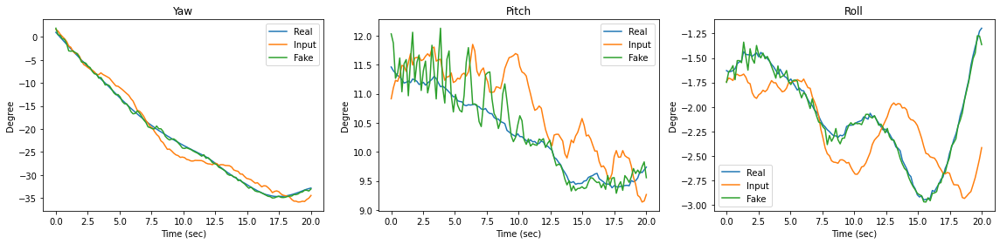

Train Epoch[351/1000] Step [01/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[351/1000] Step [02/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0002 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[351/1000] Step [01/01] d_loss: 2.0615, d_loss_real: 2.0408, d_loss_fake: 0.0207 g_loss: 0.0186 acc_real: 0.2667 acc_fake: 1.0000
Train Epoch[352/1000] Step [01/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[352/1000] Step [02/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[352/1000] Step [01/01] d_loss: 2.0007, d_loss_real: 1.9812, d_loss_fake: 0.0196 g_loss: 0.0176 acc_real: 0.2667 acc_fake: 1.0000
Train Epoch[353/1000] Step [01/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Tra

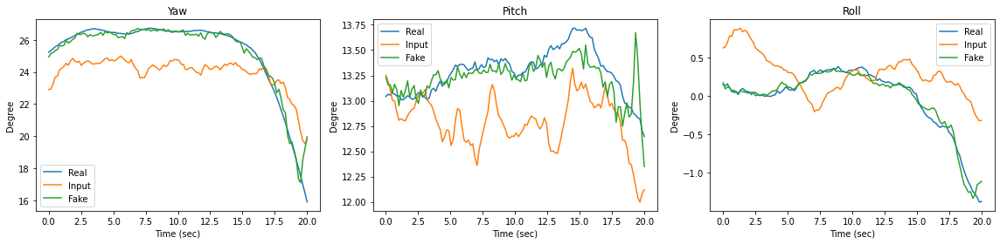

Train Epoch[361/1000] Step [01/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[361/1000] Step [02/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[361/1000] Step [01/01] d_loss: 1.9915, d_loss_real: 1.9689, d_loss_fake: 0.0226 g_loss: 0.0204 acc_real: 0.2667 acc_fake: 1.0000
Train Epoch[362/1000] Step [01/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[362/1000] Step [02/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[362/1000] Step [01/01] d_loss: 2.0730, d_loss_real: 2.0534, d_loss_fake: 0.0196 g_loss: 0.0177 acc_real: 0.2444 acc_fake: 1.0000
Train Epoch[363/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Tra

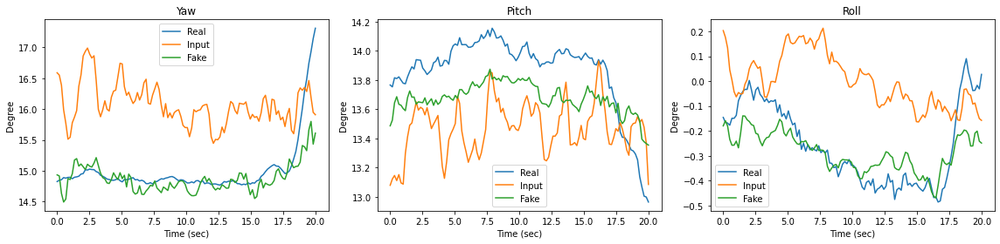

Train Epoch[371/1000] Step [01/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0002 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[371/1000] Step [02/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[371/1000] Step [01/01] d_loss: 2.2309, d_loss_real: 2.2095, d_loss_fake: 0.0215 g_loss: 0.0194 acc_real: 0.1556 acc_fake: 1.0000
Train Epoch[372/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[372/1000] Step [02/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0002 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[372/1000] Step [01/01] d_loss: 2.5003, d_loss_real: 2.4834, d_loss_fake: 0.0169 g_loss: 0.0153 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[373/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Tra

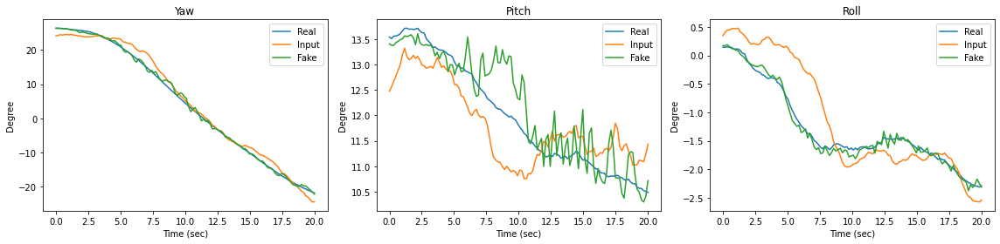

Train Epoch[381/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[381/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[381/1000] Step [01/01] d_loss: 2.3371, d_loss_real: 2.3185, d_loss_fake: 0.0186 g_loss: 0.0168 acc_real: 0.1556 acc_fake: 1.0000
Train Epoch[382/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[382/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[382/1000] Step [01/01] d_loss: 2.1990, d_loss_real: 2.1772, d_loss_fake: 0.0218 g_loss: 0.0197 acc_real: 0.1556 acc_fake: 1.0000
Train Epoch[383/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Tra

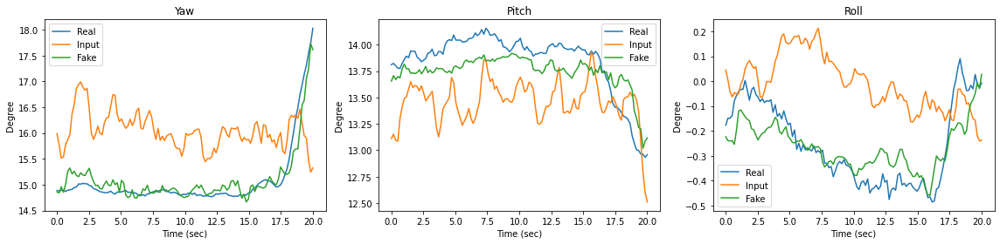

Train Epoch[391/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[391/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[391/1000] Step [01/01] d_loss: 2.0853, d_loss_real: 2.0642, d_loss_fake: 0.0211 g_loss: 0.0190 acc_real: 0.2222 acc_fake: 1.0000
Train Epoch[392/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[392/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[392/1000] Step [01/01] d_loss: 2.0725, d_loss_real: 2.0523, d_loss_fake: 0.0202 g_loss: 0.0182 acc_real: 0.2444 acc_fake: 1.0000
Train Epoch[393/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Tra

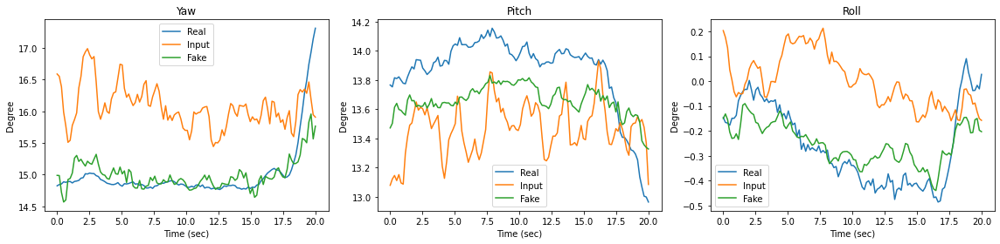

Train Epoch[401/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[401/1000] Step [02/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0003 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[401/1000] Step [01/01] d_loss: 2.2186, d_loss_real: 2.1987, d_loss_fake: 0.0199 g_loss: 0.0180 acc_real: 0.1778 acc_fake: 1.0000
Train Epoch[402/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[402/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[402/1000] Step [01/01] d_loss: 2.1899, d_loss_real: 2.1727, d_loss_fake: 0.0173 g_loss: 0.0156 acc_real: 0.1778 acc_fake: 1.0000
Train Epoch[403/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Tra

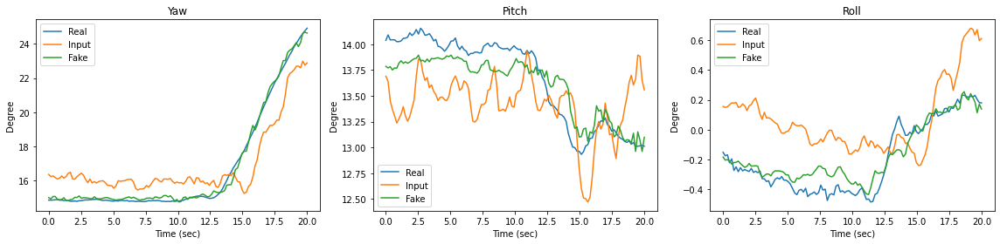

Train Epoch[411/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[411/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[411/1000] Step [01/01] d_loss: 3.0504, d_loss_real: 3.0267, d_loss_fake: 0.0237 g_loss: 0.0214 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[412/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[412/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[412/1000] Step [01/01] d_loss: 2.7679, d_loss_real: 2.7517, d_loss_fake: 0.0162 g_loss: 0.0147 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[413/1000] Step [01/02] d_loss: 0.0002, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0002 acc_real: 1.0000 acc_fake: 1.0000
Tra

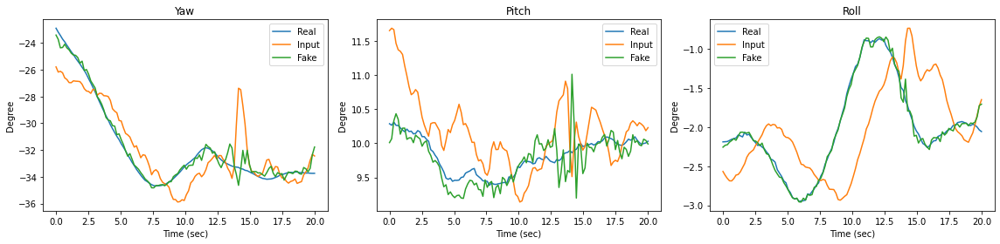

Train Epoch[421/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[421/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0001 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[421/1000] Step [01/01] d_loss: 2.1256, d_loss_real: 2.1053, d_loss_fake: 0.0203 g_loss: 0.0183 acc_real: 0.1778 acc_fake: 1.0000
Train Epoch[422/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[422/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[422/1000] Step [01/01] d_loss: 2.3550, d_loss_real: 2.3351, d_loss_fake: 0.0199 g_loss: 0.0179 acc_real: 0.1556 acc_fake: 1.0000
Train Epoch[423/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Tra

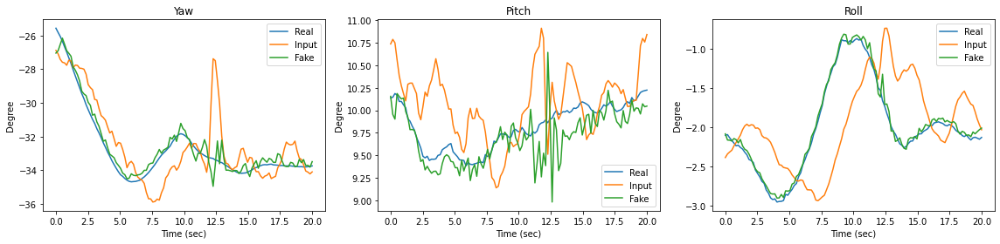

Train Epoch[431/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[431/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[431/1000] Step [01/01] d_loss: 2.3716, d_loss_real: 2.3518, d_loss_fake: 0.0199 g_loss: 0.0179 acc_real: 0.1556 acc_fake: 1.0000
Train Epoch[432/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[432/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[432/1000] Step [01/01] d_loss: 2.4847, d_loss_real: 2.4664, d_loss_fake: 0.0183 g_loss: 0.0165 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[433/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Tra

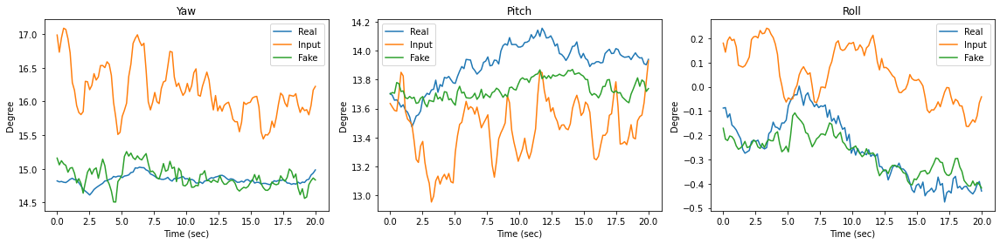

Train Epoch[441/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[441/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[441/1000] Step [01/01] d_loss: 2.2741, d_loss_real: 2.2571, d_loss_fake: 0.0170 g_loss: 0.0153 acc_real: 0.1778 acc_fake: 1.0000
Train Epoch[442/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[442/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[442/1000] Step [01/01] d_loss: 2.1951, d_loss_real: 2.1751, d_loss_fake: 0.0201 g_loss: 0.0181 acc_real: 0.1778 acc_fake: 1.0000
Train Epoch[443/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Tra

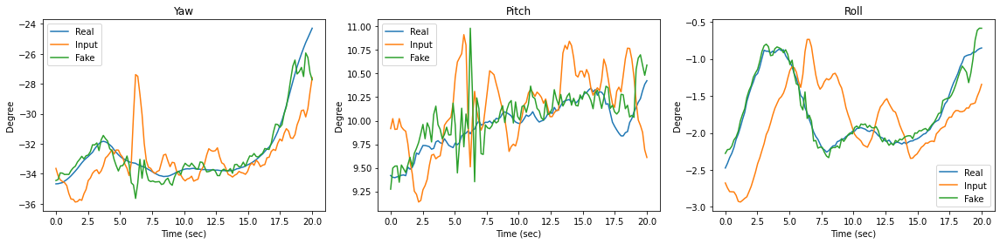

Train Epoch[451/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[451/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[451/1000] Step [01/01] d_loss: 2.3649, d_loss_real: 2.3454, d_loss_fake: 0.0194 g_loss: 0.0175 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[452/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[452/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[452/1000] Step [01/01] d_loss: 2.2397, d_loss_real: 2.2201, d_loss_fake: 0.0196 g_loss: 0.0177 acc_real: 0.1556 acc_fake: 1.0000
Train Epoch[453/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Tra

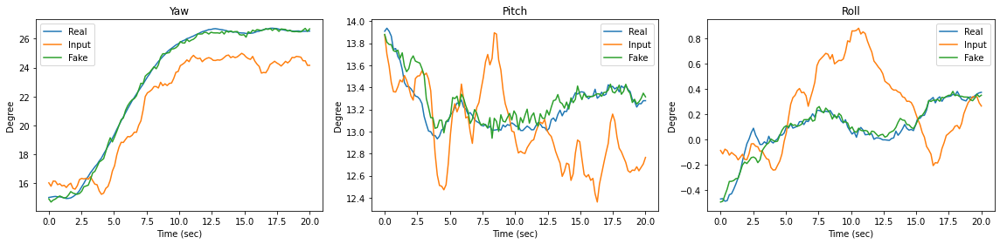

Train Epoch[461/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[461/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[461/1000] Step [01/01] d_loss: 2.0449, d_loss_real: 2.0256, d_loss_fake: 0.0192 g_loss: 0.0174 acc_real: 0.2889 acc_fake: 1.0000
Train Epoch[462/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[462/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[462/1000] Step [01/01] d_loss: 2.1434, d_loss_real: 2.1210, d_loss_fake: 0.0223 g_loss: 0.0201 acc_real: 0.2667 acc_fake: 1.0000
Train Epoch[463/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Tra

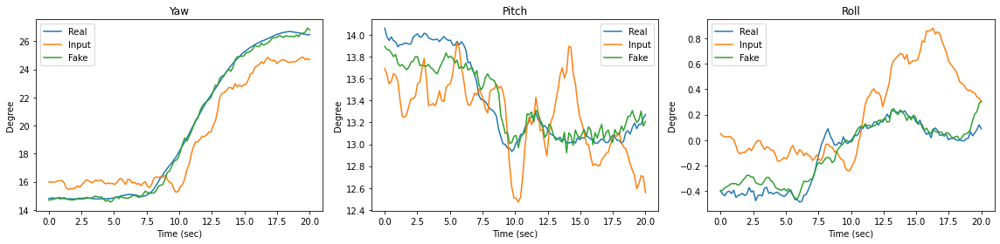

Train Epoch[471/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[471/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[471/1000] Step [01/01] d_loss: 2.2048, d_loss_real: 2.1834, d_loss_fake: 0.0213 g_loss: 0.0192 acc_real: 0.2444 acc_fake: 1.0000
Train Epoch[472/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[472/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[472/1000] Step [01/01] d_loss: 2.2210, d_loss_real: 2.2033, d_loss_fake: 0.0176 g_loss: 0.0159 acc_real: 0.2444 acc_fake: 1.0000
Train Epoch[473/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Tra

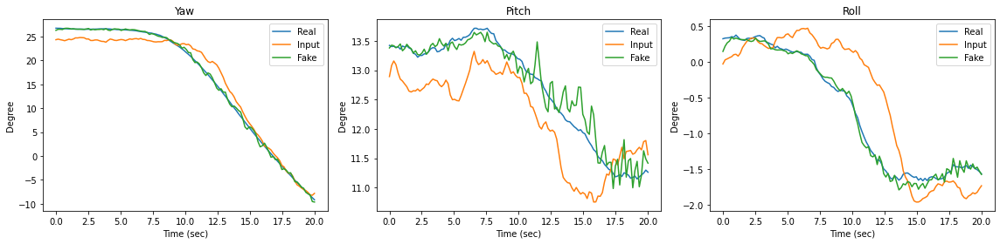

Train Epoch[481/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[481/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[481/1000] Step [01/01] d_loss: 2.2429, d_loss_real: 2.2257, d_loss_fake: 0.0172 g_loss: 0.0155 acc_real: 0.1778 acc_fake: 1.0000
Train Epoch[482/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[482/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[482/1000] Step [01/01] d_loss: 2.2030, d_loss_real: 2.1807, d_loss_fake: 0.0223 g_loss: 0.0201 acc_real: 0.2222 acc_fake: 1.0000
Train Epoch[483/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Tra

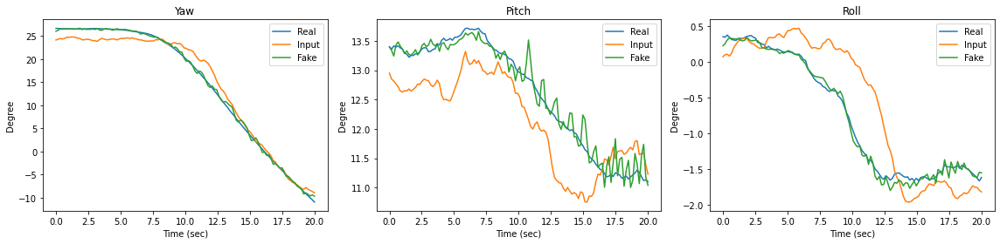

Train Epoch[491/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[491/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[491/1000] Step [01/01] d_loss: 2.1564, d_loss_real: 2.1372, d_loss_fake: 0.0191 g_loss: 0.0173 acc_real: 0.2222 acc_fake: 1.0000
Train Epoch[492/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[492/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[492/1000] Step [01/01] d_loss: 2.1054, d_loss_real: 2.0841, d_loss_fake: 0.0213 g_loss: 0.0192 acc_real: 0.2444 acc_fake: 1.0000
Train Epoch[493/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Tra

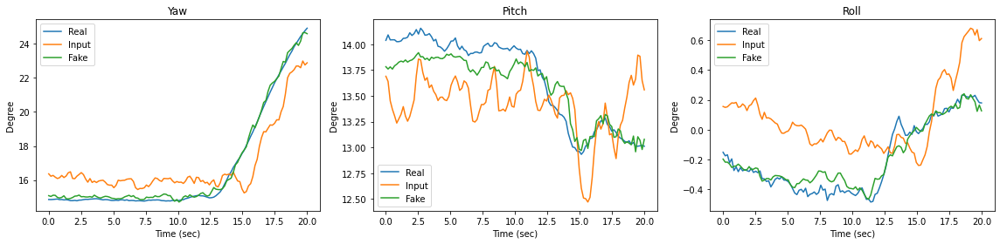

Train Epoch[501/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[501/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[501/1000] Step [01/01] d_loss: 2.2360, d_loss_real: 2.2168, d_loss_fake: 0.0192 g_loss: 0.0173 acc_real: 0.2222 acc_fake: 1.0000
Train Epoch[502/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[502/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[502/1000] Step [01/01] d_loss: 2.3167, d_loss_real: 2.2973, d_loss_fake: 0.0194 g_loss: 0.0175 acc_real: 0.1556 acc_fake: 1.0000
Train Epoch[503/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Tra

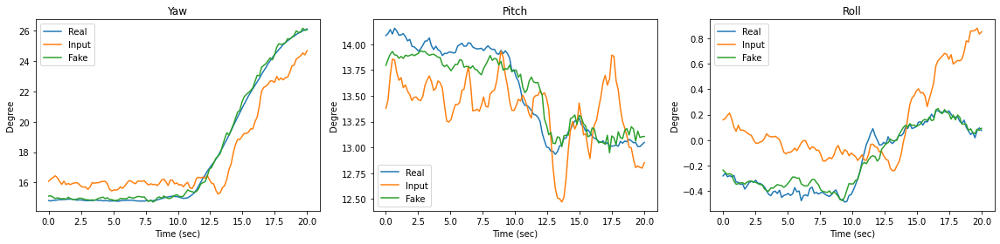

Train Epoch[511/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[511/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[511/1000] Step [01/01] d_loss: 2.2152, d_loss_real: 2.1933, d_loss_fake: 0.0219 g_loss: 0.0197 acc_real: 0.2222 acc_fake: 1.0000
Train Epoch[512/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[512/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[512/1000] Step [01/01] d_loss: 2.2933, d_loss_real: 2.2758, d_loss_fake: 0.0175 g_loss: 0.0158 acc_real: 0.1556 acc_fake: 1.0000
Train Epoch[513/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Tra

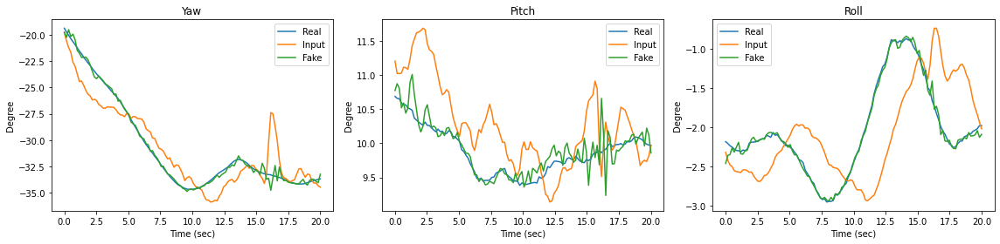

Train Epoch[521/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[521/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[521/1000] Step [01/01] d_loss: 2.2433, d_loss_real: 2.2246, d_loss_fake: 0.0187 g_loss: 0.0169 acc_real: 0.2000 acc_fake: 1.0000
Train Epoch[522/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[522/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[522/1000] Step [01/01] d_loss: 2.2350, d_loss_real: 2.2178, d_loss_fake: 0.0172 g_loss: 0.0155 acc_real: 0.2222 acc_fake: 1.0000
Train Epoch[523/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Tra

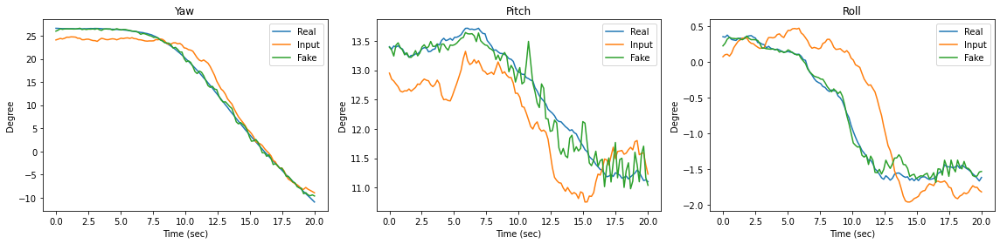

Train Epoch[531/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[531/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[531/1000] Step [01/01] d_loss: 2.2118, d_loss_real: 2.1940, d_loss_fake: 0.0178 g_loss: 0.0160 acc_real: 0.2000 acc_fake: 1.0000
Train Epoch[532/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[532/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[532/1000] Step [01/01] d_loss: 2.2007, d_loss_real: 2.1810, d_loss_fake: 0.0197 g_loss: 0.0178 acc_real: 0.2222 acc_fake: 1.0000
Train Epoch[533/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Tra

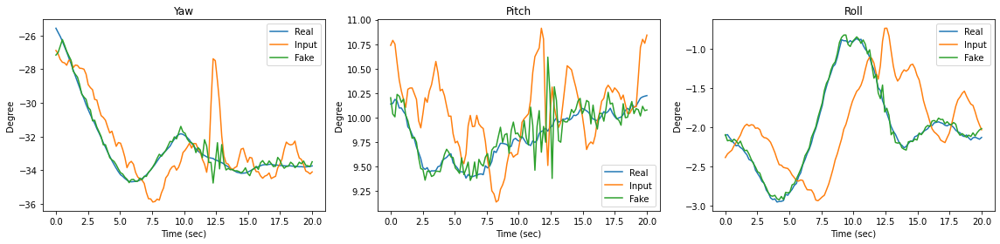

Train Epoch[541/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[541/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[541/1000] Step [01/01] d_loss: 2.4295, d_loss_real: 2.4132, d_loss_fake: 0.0162 g_loss: 0.0147 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[542/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[542/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[542/1000] Step [01/01] d_loss: 2.4333, d_loss_real: 2.4188, d_loss_fake: 0.0145 g_loss: 0.0131 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[543/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Tra

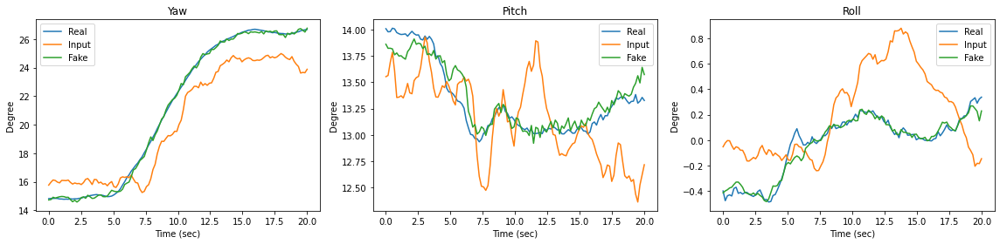

Train Epoch[551/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[551/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[551/1000] Step [01/01] d_loss: 2.5119, d_loss_real: 2.4961, d_loss_fake: 0.0158 g_loss: 0.0143 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[552/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[552/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[552/1000] Step [01/01] d_loss: 2.4035, d_loss_real: 2.3871, d_loss_fake: 0.0164 g_loss: 0.0148 acc_real: 0.1556 acc_fake: 1.0000
Train Epoch[553/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Tra

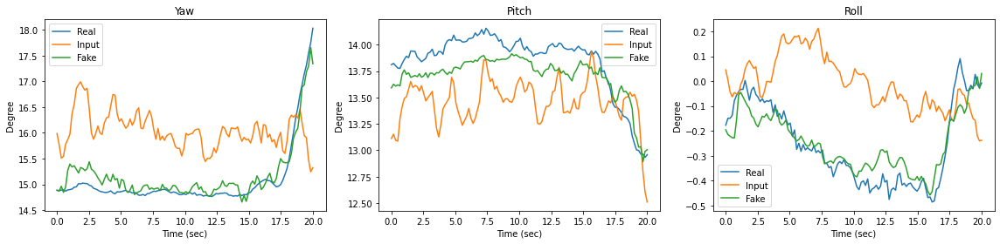

Train Epoch[561/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[561/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[561/1000] Step [01/01] d_loss: 2.2722, d_loss_real: 2.2532, d_loss_fake: 0.0190 g_loss: 0.0171 acc_real: 0.2000 acc_fake: 1.0000
Train Epoch[562/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[562/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[562/1000] Step [01/01] d_loss: 2.2735, d_loss_real: 2.2537, d_loss_fake: 0.0198 g_loss: 0.0179 acc_real: 0.2000 acc_fake: 1.0000
Train Epoch[563/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Tra

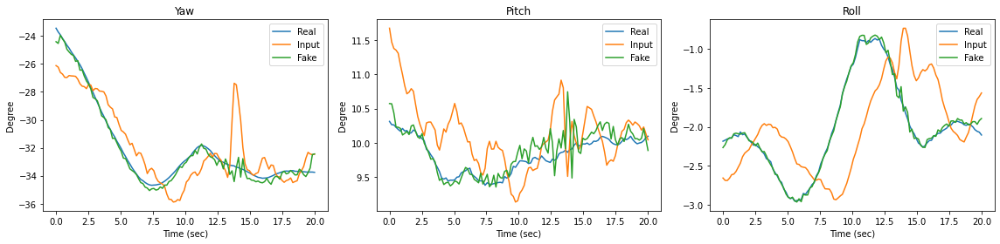

Train Epoch[571/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[571/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[571/1000] Step [01/01] d_loss: 2.3028, d_loss_real: 2.2862, d_loss_fake: 0.0166 g_loss: 0.0150 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[572/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[572/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[572/1000] Step [01/01] d_loss: 2.3175, d_loss_real: 2.2966, d_loss_fake: 0.0208 g_loss: 0.0188 acc_real: 0.1556 acc_fake: 1.0000
Train Epoch[573/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Tra

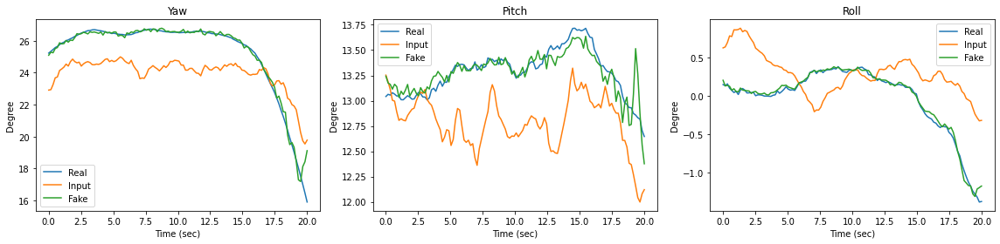

Train Epoch[581/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[581/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[581/1000] Step [01/01] d_loss: 2.3887, d_loss_real: 2.3637, d_loss_fake: 0.0251 g_loss: 0.0226 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[582/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[582/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[582/1000] Step [01/01] d_loss: 2.5052, d_loss_real: 2.4903, d_loss_fake: 0.0149 g_loss: 0.0134 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[583/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Tra

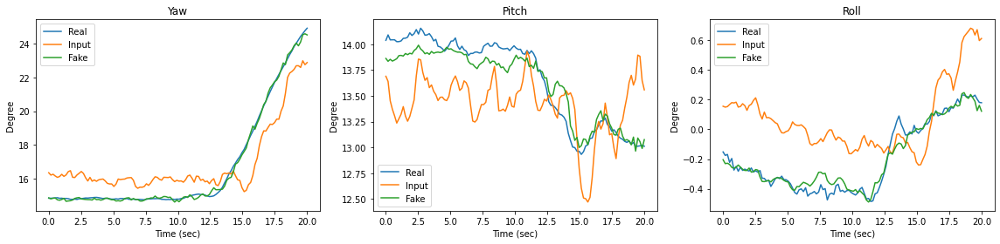

Train Epoch[591/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[591/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[591/1000] Step [01/01] d_loss: 2.3122, d_loss_real: 2.2951, d_loss_fake: 0.0171 g_loss: 0.0154 acc_real: 0.1778 acc_fake: 1.0000
Train Epoch[592/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[592/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[592/1000] Step [01/01] d_loss: 2.4378, d_loss_real: 2.4113, d_loss_fake: 0.0265 g_loss: 0.0239 acc_real: 0.1556 acc_fake: 1.0000
Train Epoch[593/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Tra

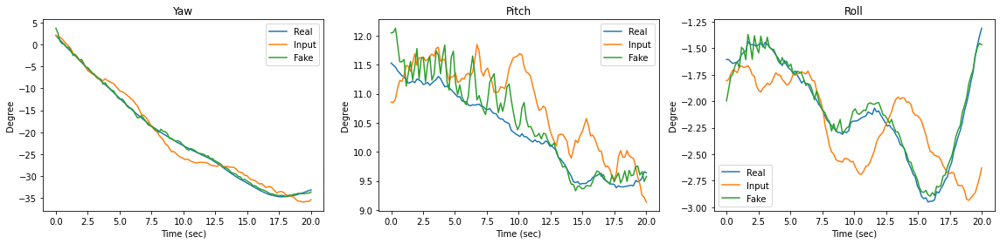

Train Epoch[601/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[601/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0001, d_loss_fake: 0.0000 g_loss: 0.0002 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[601/1000] Step [01/01] d_loss: 2.3496, d_loss_real: 2.3338, d_loss_fake: 0.0158 g_loss: 0.0143 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[602/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[602/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[602/1000] Step [01/01] d_loss: 2.5319, d_loss_real: 2.5171, d_loss_fake: 0.0148 g_loss: 0.0134 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[603/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Tra

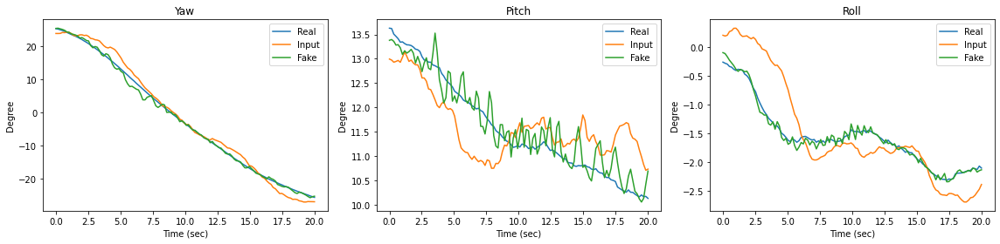

Train Epoch[611/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[611/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[611/1000] Step [01/01] d_loss: 3.5178, d_loss_real: 3.5026, d_loss_fake: 0.0153 g_loss: 0.0138 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[612/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[612/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[612/1000] Step [01/01] d_loss: 3.4505, d_loss_real: 3.4365, d_loss_fake: 0.0140 g_loss: 0.0127 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[613/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Tra

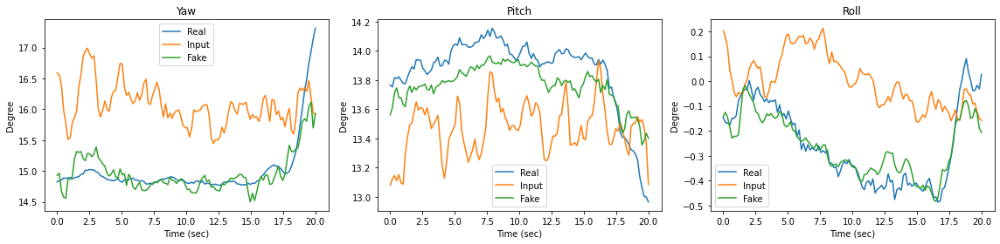

Train Epoch[621/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[621/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[621/1000] Step [01/01] d_loss: 2.5067, d_loss_real: 2.4903, d_loss_fake: 0.0164 g_loss: 0.0148 acc_real: 0.1556 acc_fake: 1.0000
Train Epoch[622/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[622/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[622/1000] Step [01/01] d_loss: 2.5883, d_loss_real: 2.5658, d_loss_fake: 0.0226 g_loss: 0.0204 acc_real: 0.1556 acc_fake: 1.0000
Train Epoch[623/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Tra

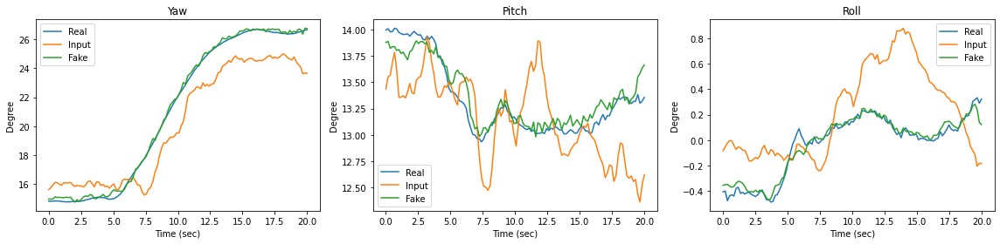

Train Epoch[631/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[631/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[631/1000] Step [01/01] d_loss: 2.5119, d_loss_real: 2.4945, d_loss_fake: 0.0174 g_loss: 0.0157 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[632/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[632/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[632/1000] Step [01/01] d_loss: 2.5695, d_loss_real: 2.5537, d_loss_fake: 0.0158 g_loss: 0.0143 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[633/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Tra

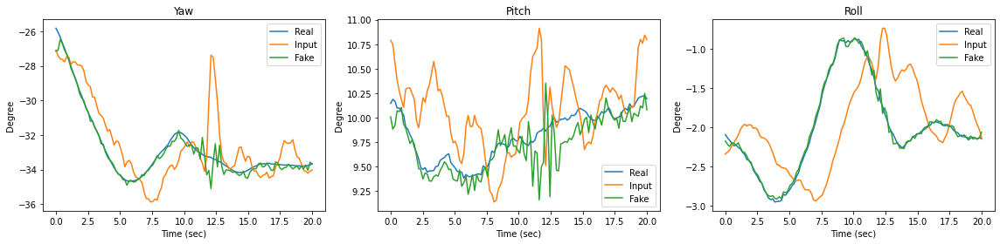

Train Epoch[641/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[641/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[641/1000] Step [01/01] d_loss: 3.0169, d_loss_real: 2.9975, d_loss_fake: 0.0194 g_loss: 0.0175 acc_real: 0.1111 acc_fake: 1.0000
Train Epoch[642/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[642/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[642/1000] Step [01/01] d_loss: 2.9565, d_loss_real: 2.9422, d_loss_fake: 0.0142 g_loss: 0.0128 acc_real: 0.1111 acc_fake: 1.0000
Train Epoch[643/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Tra

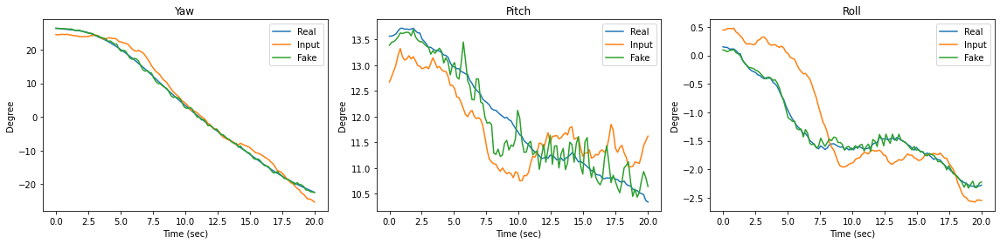

Train Epoch[651/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[651/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[651/1000] Step [01/01] d_loss: 2.7189, d_loss_real: 2.7027, d_loss_fake: 0.0162 g_loss: 0.0146 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[652/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[652/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[652/1000] Step [01/01] d_loss: 2.7945, d_loss_real: 2.7785, d_loss_fake: 0.0159 g_loss: 0.0144 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[653/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Tra

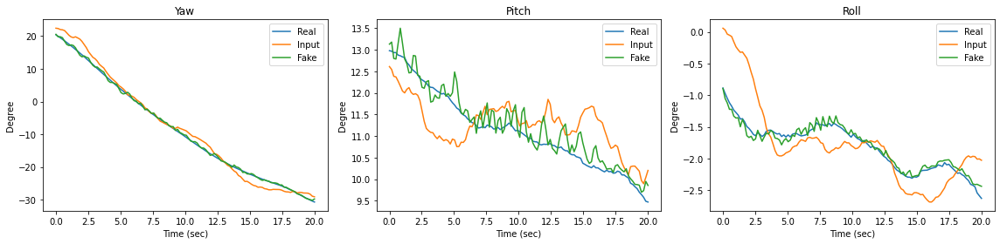

Train Epoch[661/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[661/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[661/1000] Step [01/01] d_loss: 2.0832, d_loss_real: 2.0670, d_loss_fake: 0.0161 g_loss: 0.0146 acc_real: 0.2667 acc_fake: 1.0000
Train Epoch[662/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[662/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[662/1000] Step [01/01] d_loss: 1.9403, d_loss_real: 1.9142, d_loss_fake: 0.0261 g_loss: 0.0236 acc_real: 0.3333 acc_fake: 1.0000
Train Epoch[663/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Tra

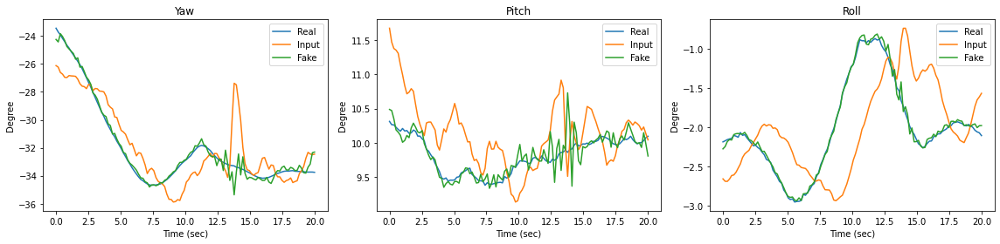

Train Epoch[671/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[671/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[671/1000] Step [01/01] d_loss: 3.1623, d_loss_real: 3.1471, d_loss_fake: 0.0152 g_loss: 0.0137 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[672/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[672/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[672/1000] Step [01/01] d_loss: 3.0710, d_loss_real: 3.0547, d_loss_fake: 0.0163 g_loss: 0.0147 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[673/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Tra

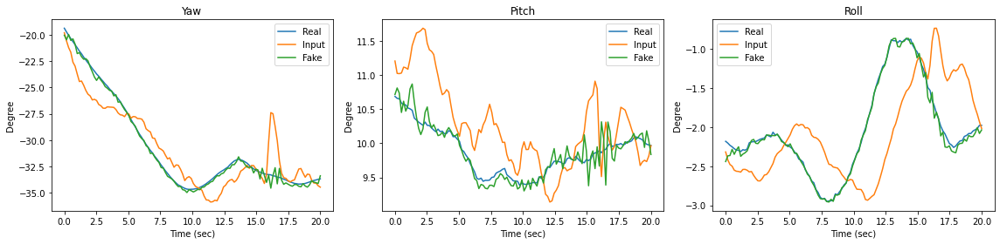

Train Epoch[681/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[681/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[681/1000] Step [01/01] d_loss: 2.4834, d_loss_real: 2.4624, d_loss_fake: 0.0209 g_loss: 0.0189 acc_real: 0.1556 acc_fake: 1.0000
Train Epoch[682/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[682/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[682/1000] Step [01/01] d_loss: 2.4167, d_loss_real: 2.3984, d_loss_fake: 0.0183 g_loss: 0.0165 acc_real: 0.1556 acc_fake: 1.0000
Train Epoch[683/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Tra

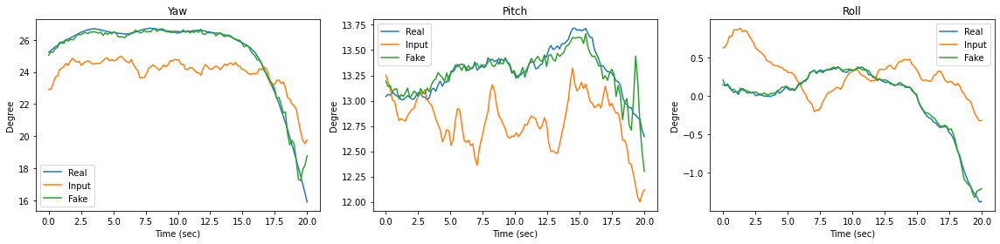

Train Epoch[691/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[691/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[691/1000] Step [01/01] d_loss: 2.4738, d_loss_real: 2.4554, d_loss_fake: 0.0184 g_loss: 0.0166 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[692/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[692/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[692/1000] Step [01/01] d_loss: 2.5960, d_loss_real: 2.5787, d_loss_fake: 0.0173 g_loss: 0.0156 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[693/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Tra

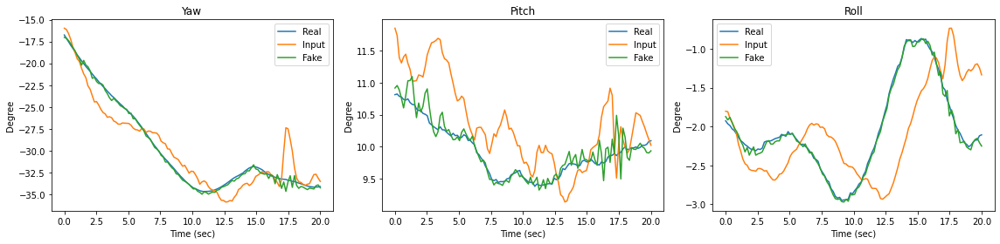

Train Epoch[701/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[701/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[701/1000] Step [01/01] d_loss: 2.4743, d_loss_real: 2.4567, d_loss_fake: 0.0176 g_loss: 0.0159 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[702/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[702/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[702/1000] Step [01/01] d_loss: 2.5057, d_loss_real: 2.4908, d_loss_fake: 0.0149 g_loss: 0.0134 acc_real: 0.1556 acc_fake: 1.0000
Train Epoch[703/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Tra

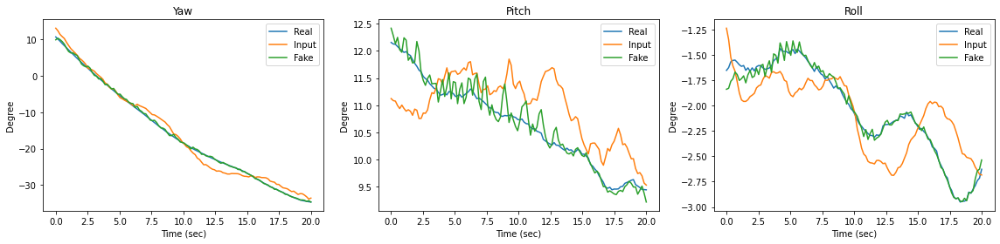

Train Epoch[711/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[711/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[711/1000] Step [01/01] d_loss: 2.5970, d_loss_real: 2.5832, d_loss_fake: 0.0138 g_loss: 0.0124 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[712/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[712/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[712/1000] Step [01/01] d_loss: 2.5067, d_loss_real: 2.4890, d_loss_fake: 0.0177 g_loss: 0.0160 acc_real: 0.1556 acc_fake: 1.0000
Train Epoch[713/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Tra

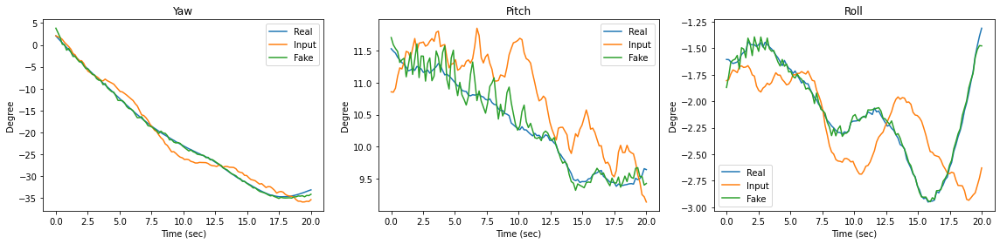

Train Epoch[721/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[721/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[721/1000] Step [01/01] d_loss: 2.4495, d_loss_real: 2.4343, d_loss_fake: 0.0152 g_loss: 0.0137 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[722/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[722/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[722/1000] Step [01/01] d_loss: 2.6078, d_loss_real: 2.5914, d_loss_fake: 0.0164 g_loss: 0.0148 acc_real: 0.1556 acc_fake: 1.0000
Train Epoch[723/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Tra

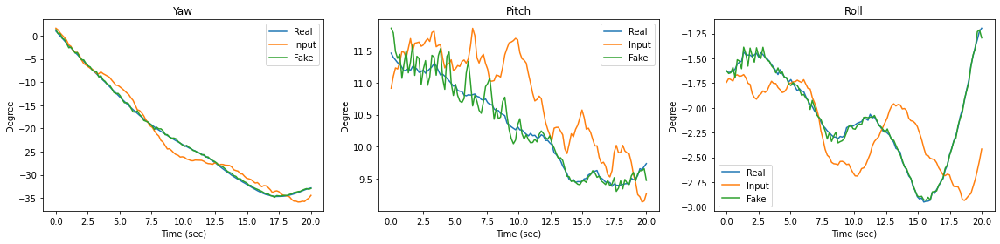

Train Epoch[731/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[731/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[731/1000] Step [01/01] d_loss: 2.5882, d_loss_real: 2.5712, d_loss_fake: 0.0170 g_loss: 0.0153 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[732/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[732/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[732/1000] Step [01/01] d_loss: 2.5143, d_loss_real: 2.4983, d_loss_fake: 0.0161 g_loss: 0.0145 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[733/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Tra

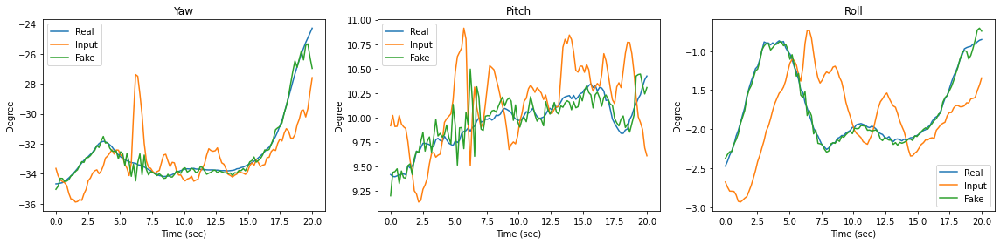

Train Epoch[741/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[741/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[741/1000] Step [01/01] d_loss: 2.5018, d_loss_real: 2.4852, d_loss_fake: 0.0166 g_loss: 0.0150 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[742/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[742/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[742/1000] Step [01/01] d_loss: 2.4644, d_loss_real: 2.4484, d_loss_fake: 0.0160 g_loss: 0.0145 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[743/1000] Step [01/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Tra

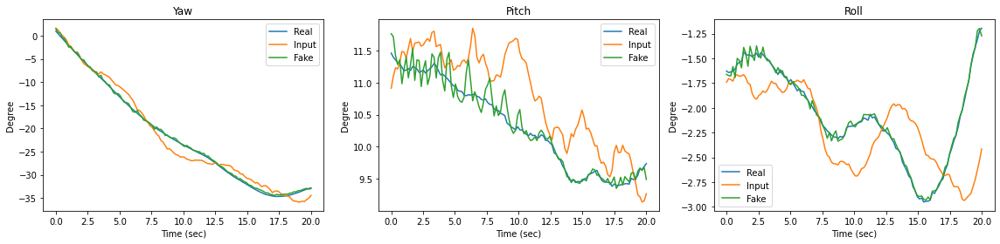

Train Epoch[751/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[751/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[751/1000] Step [01/01] d_loss: 2.6423, d_loss_real: 2.6265, d_loss_fake: 0.0158 g_loss: 0.0143 acc_real: 0.1556 acc_fake: 1.0000
Train Epoch[752/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[752/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[752/1000] Step [01/01] d_loss: 2.5473, d_loss_real: 2.5293, d_loss_fake: 0.0180 g_loss: 0.0162 acc_real: 0.1556 acc_fake: 1.0000
Train Epoch[753/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Tra

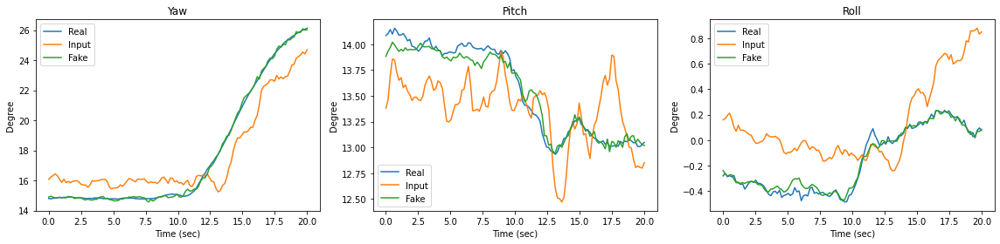

Train Epoch[761/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[761/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[761/1000] Step [01/01] d_loss: 2.4359, d_loss_real: 2.4183, d_loss_fake: 0.0176 g_loss: 0.0158 acc_real: 0.1556 acc_fake: 1.0000
Train Epoch[762/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[762/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[762/1000] Step [01/01] d_loss: 2.4250, d_loss_real: 2.4093, d_loss_fake: 0.0156 g_loss: 0.0141 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[763/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Tra

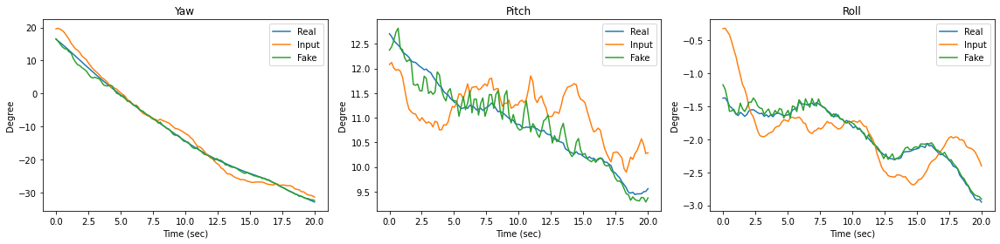

Train Epoch[771/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[771/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[771/1000] Step [01/01] d_loss: 2.6191, d_loss_real: 2.6035, d_loss_fake: 0.0156 g_loss: 0.0141 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[772/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[772/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[772/1000] Step [01/01] d_loss: 2.4509, d_loss_real: 2.4349, d_loss_fake: 0.0161 g_loss: 0.0145 acc_real: 0.1556 acc_fake: 1.0000
Train Epoch[773/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Tra

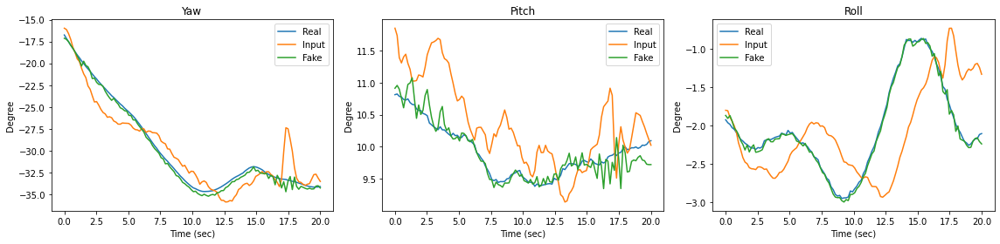

Train Epoch[781/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[781/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[781/1000] Step [01/01] d_loss: 2.5078, d_loss_real: 2.4926, d_loss_fake: 0.0152 g_loss: 0.0137 acc_real: 0.1556 acc_fake: 1.0000
Train Epoch[782/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[782/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[782/1000] Step [01/01] d_loss: 2.4463, d_loss_real: 2.4295, d_loss_fake: 0.0168 g_loss: 0.0151 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[783/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Tra

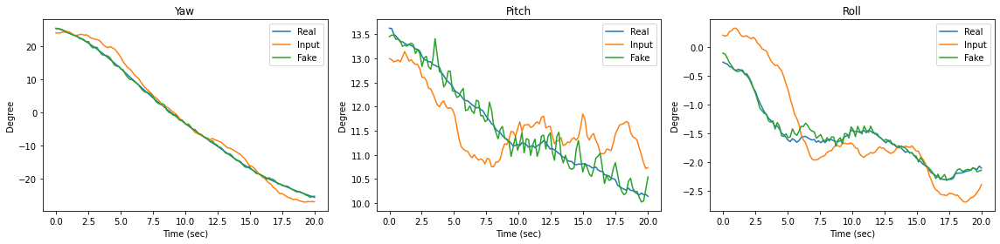

Train Epoch[791/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[791/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[791/1000] Step [01/01] d_loss: 2.5914, d_loss_real: 2.5750, d_loss_fake: 0.0164 g_loss: 0.0147 acc_real: 0.1556 acc_fake: 1.0000
Train Epoch[792/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[792/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[792/1000] Step [01/01] d_loss: 2.5604, d_loss_real: 2.5444, d_loss_fake: 0.0160 g_loss: 0.0144 acc_real: 0.1556 acc_fake: 1.0000
Train Epoch[793/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Tra

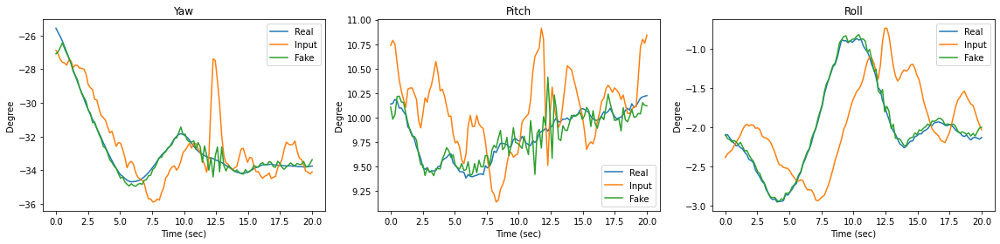

Train Epoch[801/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[801/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[801/1000] Step [01/01] d_loss: 2.4801, d_loss_real: 2.4650, d_loss_fake: 0.0151 g_loss: 0.0136 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[802/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[802/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[802/1000] Step [01/01] d_loss: 2.4700, d_loss_real: 2.4532, d_loss_fake: 0.0168 g_loss: 0.0151 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[803/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Tra

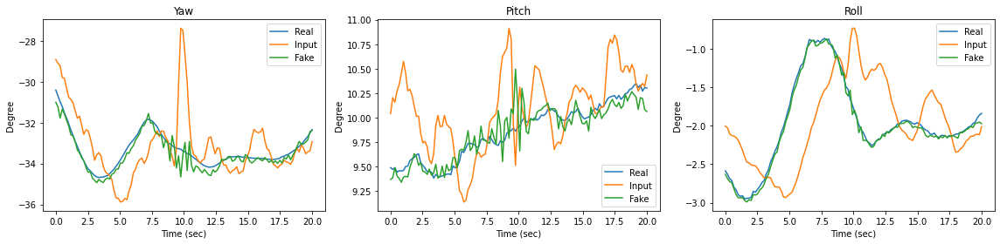

Train Epoch[811/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[811/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[811/1000] Step [01/01] d_loss: 2.6620, d_loss_real: 2.6496, d_loss_fake: 0.0124 g_loss: 0.0111 acc_real: 0.1111 acc_fake: 1.0000
Train Epoch[812/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[812/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[812/1000] Step [01/01] d_loss: 2.5301, d_loss_real: 2.5125, d_loss_fake: 0.0176 g_loss: 0.0159 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[813/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Tra

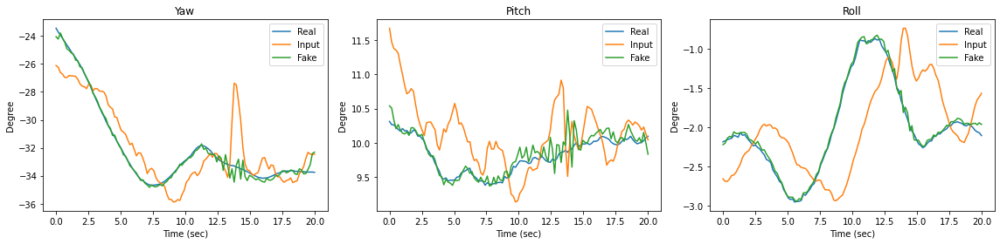

Train Epoch[821/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[821/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[821/1000] Step [01/01] d_loss: 2.6325, d_loss_real: 2.6151, d_loss_fake: 0.0173 g_loss: 0.0156 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[822/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[822/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[822/1000] Step [01/01] d_loss: 2.4964, d_loss_real: 2.4789, d_loss_fake: 0.0175 g_loss: 0.0158 acc_real: 0.1556 acc_fake: 1.0000
Train Epoch[823/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Tra

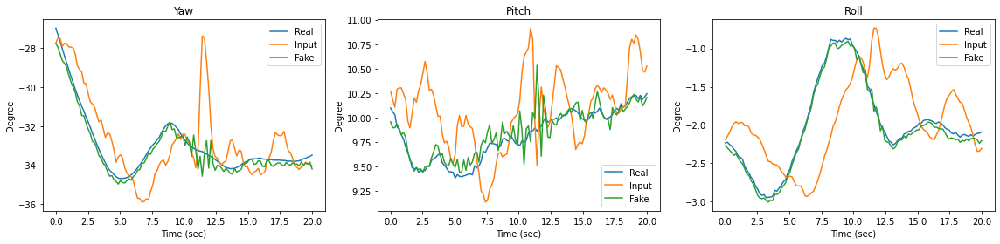

Train Epoch[831/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[831/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[831/1000] Step [01/01] d_loss: 2.5320, d_loss_real: 2.5189, d_loss_fake: 0.0131 g_loss: 0.0118 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[832/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[832/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[832/1000] Step [01/01] d_loss: 2.5304, d_loss_real: 2.5151, d_loss_fake: 0.0152 g_loss: 0.0137 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[833/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Tra

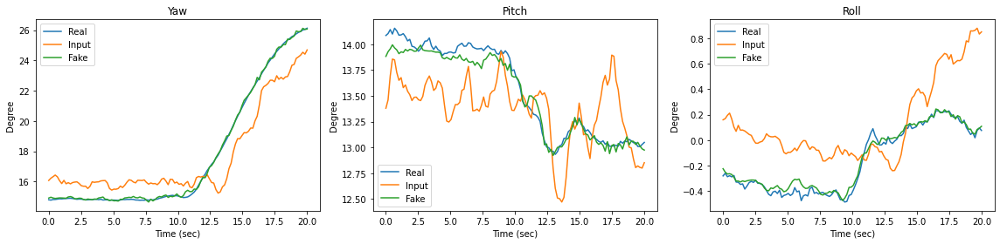

Train Epoch[841/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[841/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[841/1000] Step [01/01] d_loss: 2.6367, d_loss_real: 2.6206, d_loss_fake: 0.0160 g_loss: 0.0145 acc_real: 0.1556 acc_fake: 1.0000
Train Epoch[842/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[842/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[842/1000] Step [01/01] d_loss: 2.5498, d_loss_real: 2.5330, d_loss_fake: 0.0168 g_loss: 0.0151 acc_real: 0.1556 acc_fake: 1.0000
Train Epoch[843/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Tra

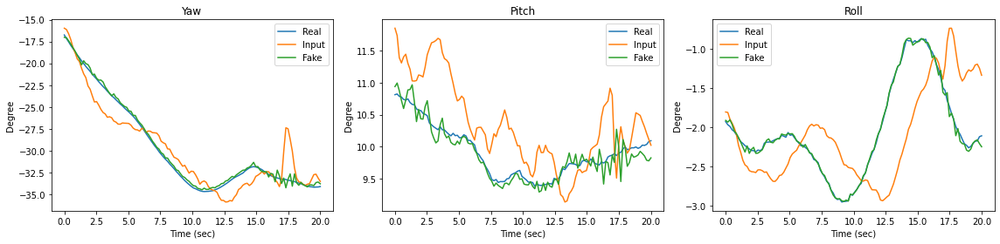

Train Epoch[851/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[851/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[851/1000] Step [01/01] d_loss: 2.5308, d_loss_real: 2.5119, d_loss_fake: 0.0188 g_loss: 0.0170 acc_real: 0.1556 acc_fake: 1.0000
Train Epoch[852/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[852/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[852/1000] Step [01/01] d_loss: 2.5869, d_loss_real: 2.5716, d_loss_fake: 0.0153 g_loss: 0.0138 acc_real: 0.1556 acc_fake: 1.0000
Train Epoch[853/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Tra

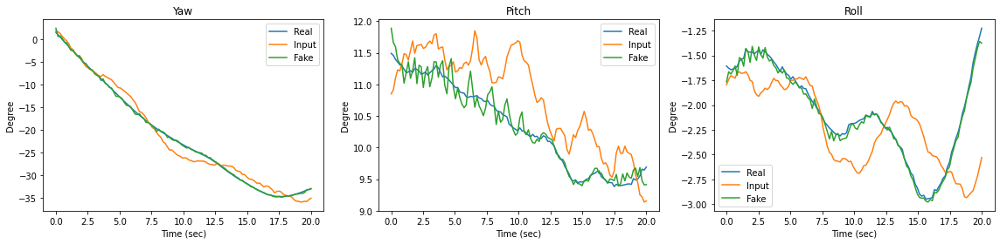

Train Epoch[861/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[861/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[861/1000] Step [01/01] d_loss: 2.7919, d_loss_real: 2.7782, d_loss_fake: 0.0137 g_loss: 0.0123 acc_real: 0.1556 acc_fake: 1.0000
Train Epoch[862/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[862/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[862/1000] Step [01/01] d_loss: 2.7000, d_loss_real: 2.6865, d_loss_fake: 0.0135 g_loss: 0.0122 acc_real: 0.1111 acc_fake: 1.0000
Train Epoch[863/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Tra

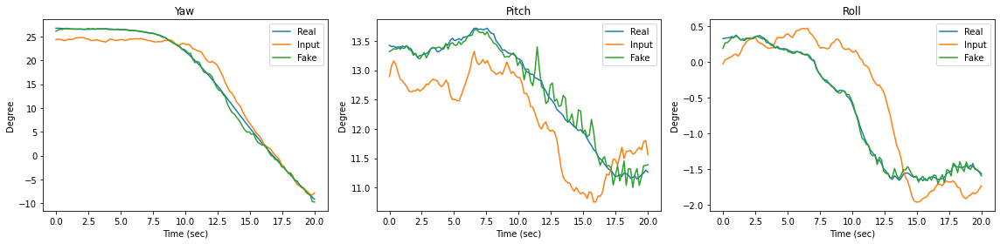

Train Epoch[871/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[871/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[871/1000] Step [01/01] d_loss: 2.7866, d_loss_real: 2.7748, d_loss_fake: 0.0119 g_loss: 0.0107 acc_real: 0.1111 acc_fake: 1.0000
Train Epoch[872/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[872/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[872/1000] Step [01/01] d_loss: 2.6166, d_loss_real: 2.5984, d_loss_fake: 0.0182 g_loss: 0.0164 acc_real: 0.1556 acc_fake: 1.0000
Train Epoch[873/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Tra

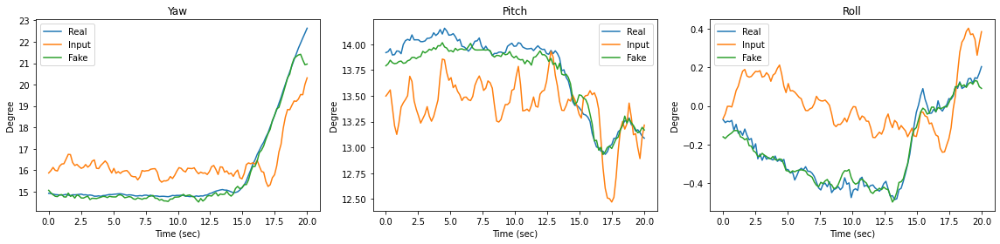

Train Epoch[881/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[881/1000] Step [02/02] d_loss: 0.0001, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[881/1000] Step [01/01] d_loss: 2.6734, d_loss_real: 2.6539, d_loss_fake: 0.0195 g_loss: 0.0176 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[882/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[882/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[882/1000] Step [01/01] d_loss: 2.9524, d_loss_real: 2.9417, d_loss_fake: 0.0107 g_loss: 0.0096 acc_real: 0.0889 acc_fake: 1.0000
Train Epoch[883/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Tra

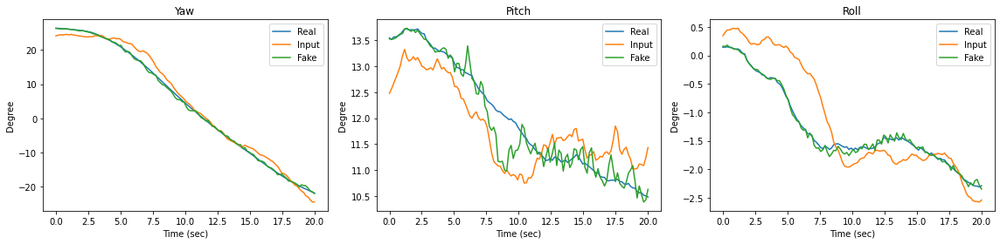

Train Epoch[891/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[891/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[891/1000] Step [01/01] d_loss: 2.4380, d_loss_real: 2.4188, d_loss_fake: 0.0192 g_loss: 0.0173 acc_real: 0.1556 acc_fake: 1.0000
Train Epoch[892/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[892/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[892/1000] Step [01/01] d_loss: 2.6833, d_loss_real: 2.6677, d_loss_fake: 0.0156 g_loss: 0.0141 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[893/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Tra

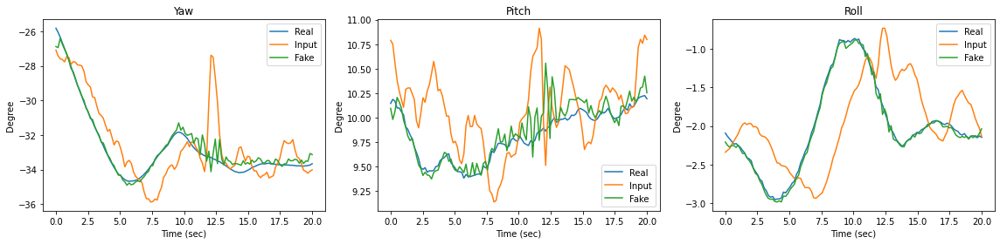

Train Epoch[901/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[901/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[901/1000] Step [01/01] d_loss: 2.9092, d_loss_real: 2.8951, d_loss_fake: 0.0141 g_loss: 0.0127 acc_real: 0.1111 acc_fake: 1.0000
Train Epoch[902/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[902/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[902/1000] Step [01/01] d_loss: 2.8561, d_loss_real: 2.8394, d_loss_fake: 0.0166 g_loss: 0.0150 acc_real: 0.1556 acc_fake: 1.0000
Train Epoch[903/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Tra

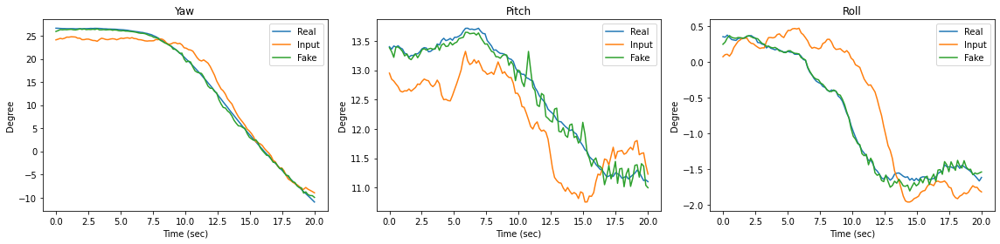

Train Epoch[911/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[911/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[911/1000] Step [01/01] d_loss: 2.6220, d_loss_real: 2.6081, d_loss_fake: 0.0139 g_loss: 0.0125 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[912/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[912/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[912/1000] Step [01/01] d_loss: 2.6062, d_loss_real: 2.5924, d_loss_fake: 0.0139 g_loss: 0.0125 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[913/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Tra

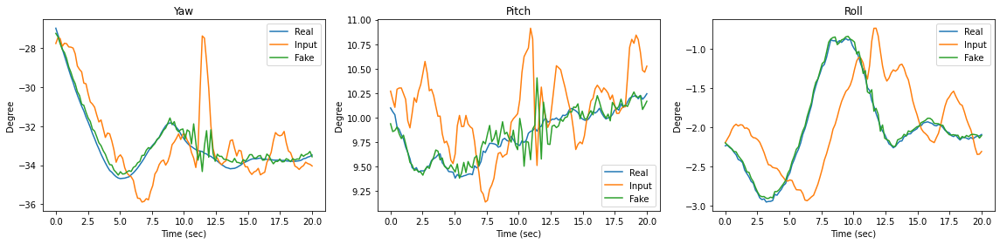

Train Epoch[921/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[921/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[921/1000] Step [01/01] d_loss: 2.8349, d_loss_real: 2.8232, d_loss_fake: 0.0117 g_loss: 0.0105 acc_real: 0.1111 acc_fake: 1.0000
Train Epoch[922/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[922/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[922/1000] Step [01/01] d_loss: 2.7504, d_loss_real: 2.7359, d_loss_fake: 0.0145 g_loss: 0.0131 acc_real: 0.1111 acc_fake: 1.0000
Train Epoch[923/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Tra

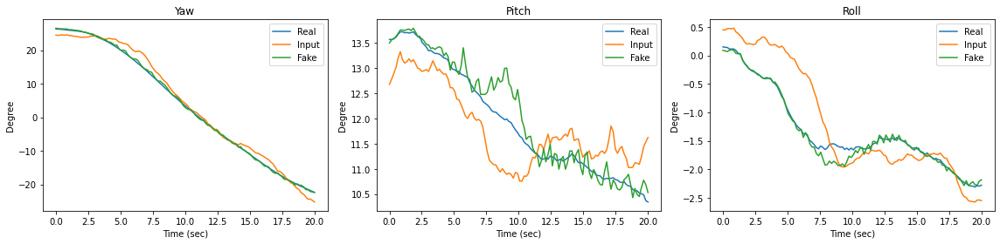

Train Epoch[931/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[931/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[931/1000] Step [01/01] d_loss: 2.8855, d_loss_real: 2.8701, d_loss_fake: 0.0154 g_loss: 0.0139 acc_real: 0.1556 acc_fake: 1.0000
Train Epoch[932/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[932/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[932/1000] Step [01/01] d_loss: 2.8648, d_loss_real: 2.8462, d_loss_fake: 0.0186 g_loss: 0.0168 acc_real: 0.1111 acc_fake: 1.0000
Train Epoch[933/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Tra

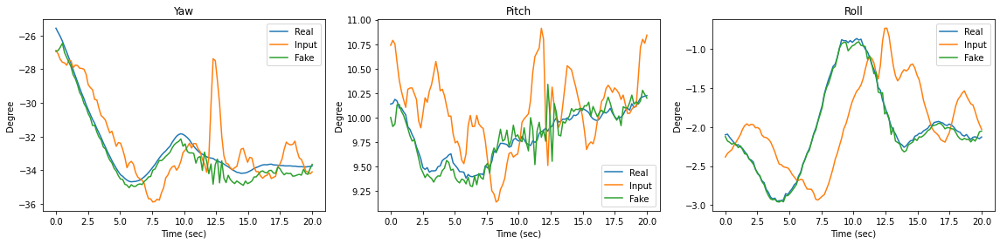

Train Epoch[941/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[941/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[941/1000] Step [01/01] d_loss: 2.9953, d_loss_real: 2.9786, d_loss_fake: 0.0167 g_loss: 0.0151 acc_real: 0.1111 acc_fake: 1.0000
Train Epoch[942/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[942/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[942/1000] Step [01/01] d_loss: 2.8147, d_loss_real: 2.8008, d_loss_fake: 0.0139 g_loss: 0.0125 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[943/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Tra

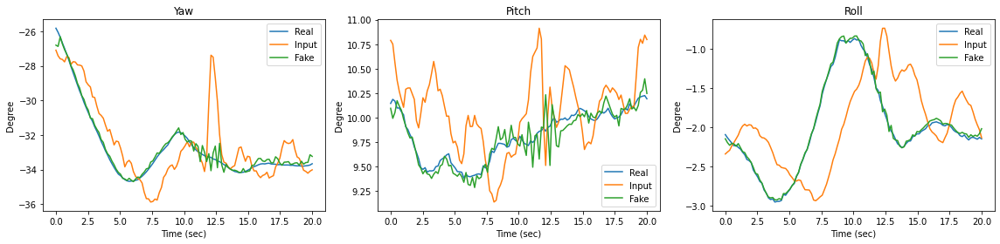

Train Epoch[951/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[951/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[951/1000] Step [01/01] d_loss: 2.6993, d_loss_real: 2.6807, d_loss_fake: 0.0186 g_loss: 0.0167 acc_real: 0.1556 acc_fake: 1.0000
Train Epoch[952/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[952/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[952/1000] Step [01/01] d_loss: 2.7227, d_loss_real: 2.7107, d_loss_fake: 0.0120 g_loss: 0.0109 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[953/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Tra

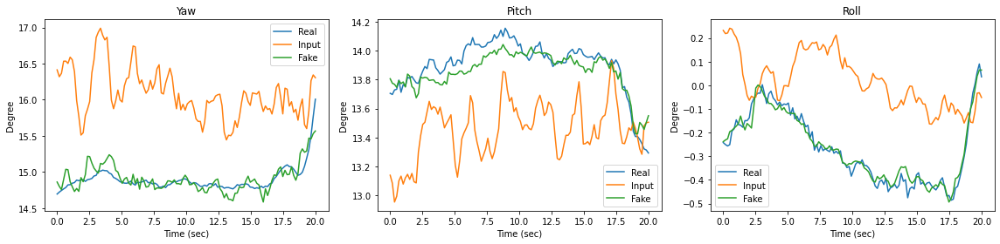

Train Epoch[961/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[961/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[961/1000] Step [01/01] d_loss: 2.6089, d_loss_real: 2.5914, d_loss_fake: 0.0175 g_loss: 0.0158 acc_real: 0.1556 acc_fake: 1.0000
Train Epoch[962/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[962/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[962/1000] Step [01/01] d_loss: 2.6159, d_loss_real: 2.6023, d_loss_fake: 0.0135 g_loss: 0.0122 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[963/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Tra

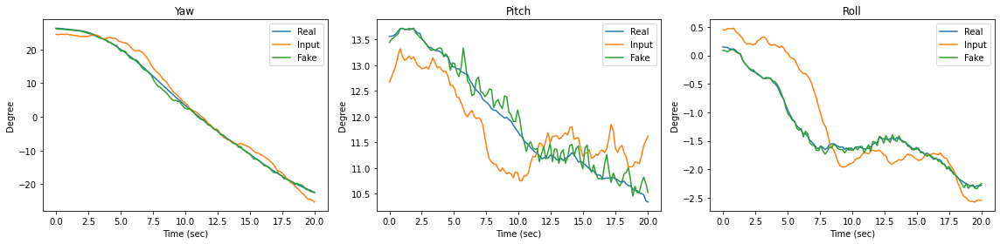

Train Epoch[971/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[971/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[971/1000] Step [01/01] d_loss: 2.9717, d_loss_real: 2.9581, d_loss_fake: 0.0137 g_loss: 0.0123 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[972/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[972/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0001 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[972/1000] Step [01/01] d_loss: 2.9793, d_loss_real: 2.9686, d_loss_fake: 0.0107 g_loss: 0.0097 acc_real: 0.0889 acc_fake: 1.0000
Train Epoch[973/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Tra

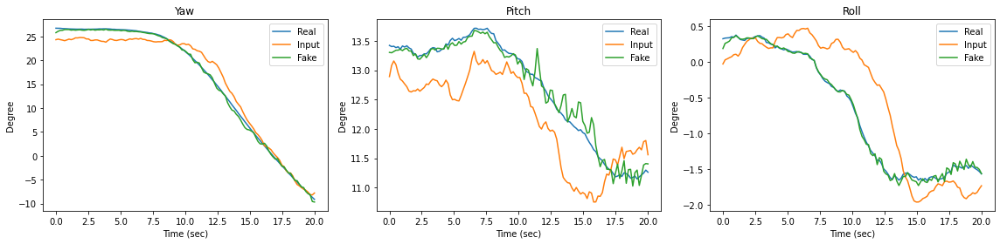

Train Epoch[981/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[981/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[981/1000] Step [01/01] d_loss: 2.9348, d_loss_real: 2.9208, d_loss_fake: 0.0140 g_loss: 0.0126 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[982/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[982/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[982/1000] Step [01/01] d_loss: 2.8012, d_loss_real: 2.7884, d_loss_fake: 0.0128 g_loss: 0.0116 acc_real: 0.1333 acc_fake: 1.0000
Train Epoch[983/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Tra

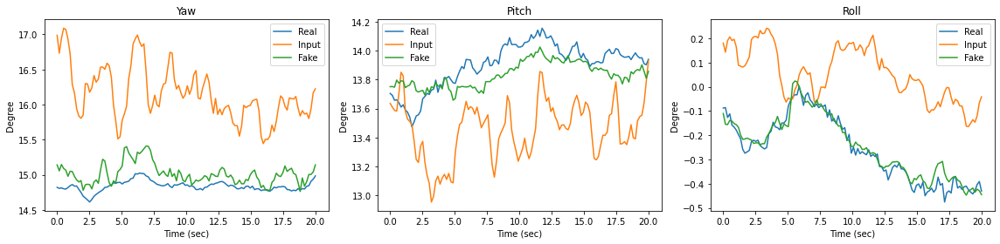

Train Epoch[991/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[991/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[991/1000] Step [01/01] d_loss: 3.3886, d_loss_real: 3.3773, d_loss_fake: 0.0114 g_loss: 0.0103 acc_real: 0.1111 acc_fake: 1.0000
Train Epoch[992/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Train Epoch[992/1000] Step [02/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Validation Epoch[992/1000] Step [01/01] d_loss: 3.4143, d_loss_real: 3.3994, d_loss_fake: 0.0149 g_loss: 0.0135 acc_real: 0.1111 acc_fake: 1.0000
Train Epoch[993/1000] Step [01/02] d_loss: 0.0000, d_loss_real: 0.0000, d_loss_fake: 0.0000 g_loss: 0.0000 acc_real: 1.0000 acc_fake: 1.0000
Tra

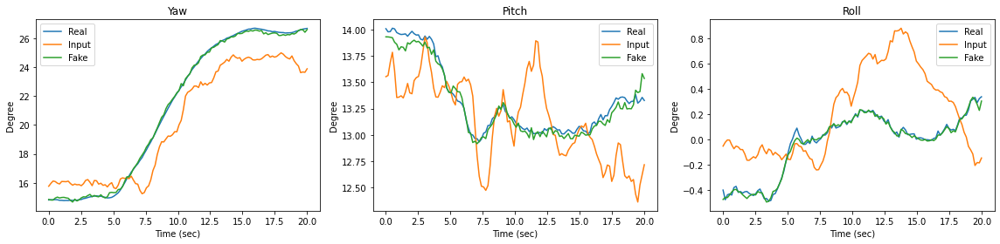

In [21]:
num_epochs = 1000

gen_weight = 0.1

for epoch in range(1, num_epochs + 1):
    # ===============================================================
    #                      Train Loop
    # ===============================================================
    G.train()
    D.train()
    total_steps = len(dl_train)
    for step, (x_real, x_fake) in enumerate(dl_train, 1):
        x_real = x_real.cuda()
        x_fake = x_fake.cuda()
        x_gen = G(x_fake)
        
        y_real = torch.ones(x_real.shape[0], 1, dtype=torch.float32).cuda()
        y_fake = torch.zeros(x_fake.shape[0], 1, dtype=torch.float32).cuda()
        
        pred_real = D(x_real)
        pred_fake = D(x_gen)
        
        d_loss_real = d_criterion(pred_real, y_real)
        d_loss_fake = d_criterion(pred_fake, y_fake)
        d_loss = (d_loss_real + d_loss_fake)
        d_optimizer.zero_grad()
        d_loss.backward()
        d_optimizer.step()
        
        # Calculate detector accuracy, percentage of hits, 
        acc_real = ((pred_real >= 0.5) * 1).sum() / y_real.numel()
        acc_fake = ((pred_fake < 0.5) * 1).sum() / y_fake.numel()
        
        x_gen = G(x_fake)
        pred_fake = D(x_gen)
        g_loss_real = g_criterion(x_gen, x_real)
        d_loss_fake = d_criterion(pred_fake, y_fake)
        g_loss = g_loss_real * gen_weight + d_loss_fake * (1 - gen_weight)
        #g_loss = d_loss_fake
        
        g_optimizer.zero_grad()
        g_loss.backward()
        g_optimizer.step()
        
        print(f'Train Epoch[{epoch:03d}/{num_epochs:03d}] Step [{step:02d}/{total_steps:02d}] '
              f'd_loss: {d_loss.item():.4f}, '
              f'd_loss_real: {d_loss_real.item():.4f}, '
              f'd_loss_fake: {d_loss_fake:.4f} '
              f'g_loss: {g_loss.item():.4f} '
              f'acc_real: {acc_real.item():.4f} '
              f'acc_fake: {acc_fake.item():.4f}')
        
    # ===============================================================
    #                      Validation Loop
    # ===============================================================
    with torch.no_grad():
        G.eval()
        D.eval()
        total_steps = len(dl_test)
        for step, (x_real, x_fake) in enumerate(dl_test, 1):
            x_real = x_real.cuda()
            x_fake = x_fake.cuda()
            x_gen = G(x_fake)

            y_real = torch.ones(x_real.shape[0], 1, dtype=torch.float32).cuda()
            y_fake = torch.zeros(x_fake.shape[0], 1, dtype=torch.float32).cuda()

            pred_real = D(x_real)
            pred_fake = D(x_gen)

            d_loss_real = d_criterion(pred_real, y_real)
            d_loss_fake = d_criterion(pred_fake, y_fake)
            d_loss = (d_loss_real + d_loss_fake)
        
            # Calculate detector accuracy, percentage of hits, 
            acc_real = ((pred_real >= 0.5) * 1).sum() / y_real.numel()
            acc_fake = ((pred_fake < 0.5) * 1).sum() / y_fake.numel()

            x_gen = G(x_fake)
            pred_fake = D(x_gen)
            g_loss_real = g_criterion(x_gen, x_real)
            d_loss_fake = d_criterion(pred_fake, y_fake)
            g_loss = g_loss_real * gen_weight + d_loss_fake * (1 - gen_weight)
            #g_loss = d_loss_fake

            print(f'Validation Epoch[{epoch:03d}/{num_epochs:03d}] Step [{step:02d}/{total_steps:02d}] '
              f'd_loss: {d_loss.item():.4f}, '
              f'd_loss_real: {d_loss_real.item():.4f}, '
              f'd_loss_fake: {d_loss_fake:.4f} '
              f'g_loss: {g_loss.item():.4f} '
              f'acc_real: {acc_real.item():.4f} '
              f'acc_fake: {acc_fake.item():.4f}')

        if epoch % 10 == 0:
            plot_result()

# ds_test2에서도 결과가 잘 나오는지 확인

In [22]:
dl_test2 = DataLoader(ds_test2,  batch_size=256, num_workers=2, pin_memory=True, shuffle=True)

Validation Epoch[9999/1000] Step [01/01] d_loss: 2.8884, d_loss_real: 2.8786, d_loss_fake: 0.0098 g_loss: 0.0089 acc_real: 0.0889 acc_fake: 1.0000


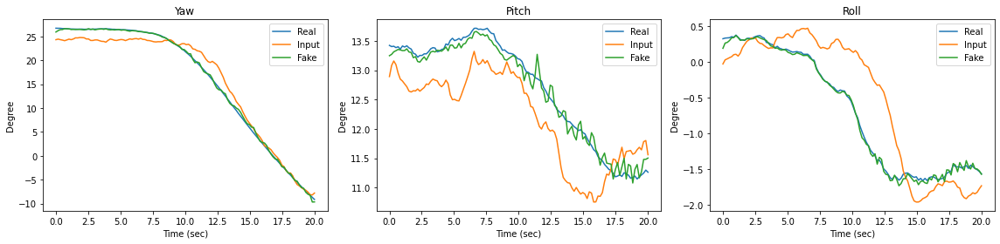

In [23]:
epoch = 9999

with torch.no_grad():
    G.eval()
    D.eval()
    
    total_steps = len(dl_test)
    for step, (x_real, x_fake) in enumerate(dl_test, 1):
        x_real = x_real.cuda()
        x_fake = x_fake.cuda()
        x_gen = G(x_fake)

        y_real = torch.ones(x_real.shape[0], 1, dtype=torch.float32).cuda()
        y_fake = torch.zeros(x_fake.shape[0], 1, dtype=torch.float32).cuda()

        pred_real = D(x_real)
        pred_fake = D(x_gen)

        d_loss_real = d_criterion(pred_real, y_real)
        d_loss_fake = d_criterion(pred_fake, y_fake)
        d_loss = (d_loss_real + d_loss_fake)

        # Calculate detector accuracy, percentage of hits, 
        acc_real = ((pred_real >= 0.5) * 1).sum() / y_real.numel()
        acc_fake = ((pred_fake < 0.5) * 1).sum() / y_fake.numel()

        x_gen = G(x_fake)
        pred_fake = D(x_gen)
        g_loss_real = g_criterion(x_gen, x_real)
        d_loss_fake = d_criterion(pred_fake, y_fake)
        g_loss = g_loss_real * gen_weight + d_loss_fake * (1 - gen_weight)
        #g_loss = d_loss_fake

        print(f'Validation Epoch[{epoch:03d}/{num_epochs:03d}] Step [{step:02d}/{total_steps:02d}] '
          f'd_loss: {d_loss.item():.4f}, '
          f'd_loss_real: {d_loss_real.item():.4f}, '
          f'd_loss_fake: {d_loss_fake:.4f} '
          f'g_loss: {g_loss.item():.4f} '
          f'acc_real: {acc_real.item():.4f} '
          f'acc_fake: {acc_fake.item():.4f}')

    plot_result()

# 할것

- D 모델 accuracy 구하기
- Yaw, pitch, roll RMS랑 99%tile 구하기